# Library

In [1]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score, KFold, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import randint, uniform
import shap

c:\skripsi\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
df_train = pd.read_csv('C:/skripsi/rev6_apr/data_ori/train_ori_6apr.csv')
df_test  = pd.read_csv('C:/skripsi/rev6_apr/data_ori/test_ori_6apr.csv')

In [4]:
kecamatan_dummies_train = pd.get_dummies(
    df_train['kecamatan'], 
    prefix='kecamatan'
).astype(int)

df_train = pd.concat(
    [df_train.drop('kecamatan', axis=1), kecamatan_dummies_train],
    axis=1
)

kecamatan_dummies_test = pd.get_dummies(
    df_test['kecamatan'], 
    prefix='kecamatan'
).astype(int)

# Samakan kolom dummy test dengan train
kecamatan_dummies_test = kecamatan_dummies_test.reindex(
    columns=kecamatan_dummies_train.columns,
    fill_value=0
)

df_test = pd.concat(
    [df_test.drop('kecamatan', axis=1), kecamatan_dummies_test],
    axis=1
)

display(df_train.head())

,Harga_Asli,bedroom,bathrooms,jumlah_guest_toilet,lantai,area_digunakan,luas_tanah,latitude,longitude,dist_SD,...,kecamatan_Prambon,kecamatan_Sedati,kecamatan_Sidoarjo,kecamatan_Sukodono,kecamatan_Taman,kecamatan_Tanggulangin,kecamatan_Tarik,kecamatan_Tulangan,kecamatan_Waru,kecamatan_Wonoayu
0,67.5,3,1,0,1,91,91,-7.391772,112.730670,0.811599,...,0,0,0,0,0,0,0,0,0,0
1,135.0,4,3,0,1,204,102,-7.526800,112.663700,7.897964,...,0,0,0,0,0,0,0,0,0,0
2,63.1,3,3,3,1,80,90,-7.481293,112.646861,6.327984,...,0,0,0,0,0,0,0,1,0,0
3,38.5,2,1,0,1,100,60,-7.394061,112.673881,0.841155,...,0,0,0,1,0,0,0,0,0,0
4,70.0,2,1,0,2,140,179,-7.451411,112.687169,1.270364,...,0,0,1,0,0,0,0,0,0,0


In [5]:
import warnings
warnings.filterwarnings('ignore')

class ZScoreTransformer:
    """Custom Z-Score Transformer untuk standardisasi target."""
    def __init__(self):
        self.fitted = False
        self.mean_ = None
        self.std_ = None
    
    def fit(self, X):
        """Hitung mean dan standar deviasi dari data train."""
        arr = np.asarray(X, dtype=float).reshape(-1, 1)
        self.mean_ = float(np.mean(arr))
        self.std_ = float(np.std(arr, ddof=0))
        if self.std_ == 0:
            self.std_ = 1.0
        self.fitted = True
        return self
    
    def transform(self, X):
        """Apply standardisasi z-score."""
        if not self.fitted:
            raise ValueError("Transformer harus di-fit terlebih dahulu.")
        arr = np.asarray(X, dtype=float).reshape(-1, 1)
        return (arr - self.mean_) / self.std_
    
    def fit_transform(self, X):
        """Fit lalu transform dalam satu langkah."""
        self.fit(X)
        return self.transform(X)
    
    def inverse_transform(self, X):
        """Kembalikan data ke skala asli."""
        if not self.fitted:
            raise ValueError("Transformer harus di-fit terlebih dahulu.")
        arr = np.asarray(X, dtype=float).reshape(-1, 1)
        return (arr * self.std_) + self.mean_

num_cols = ['Harga_Asli']
fitted_transformers = {}

train_df_transformed = df_train.copy()
val_df_transformed = df_test.copy()

for col in num_cols:
    zscore_transformer = ZScoreTransformer()
    
    train_values = train_df_transformed[col].values.reshape(-1, 1)
    val_values = val_df_transformed[col].values.reshape(-1, 1)
    
    zscore_transformer.fit(train_values)
    
    train_df_transformed[col] = zscore_transformer.transform(train_values)
    val_df_transformed[col] = zscore_transformer.transform(val_values)
    
    fitted_transformers[col.lower()] = zscore_transformer

display(train_df_transformed.head())
display(val_df_transformed.head())

,Harga_Asli,bedroom,bathrooms,jumlah_guest_toilet,lantai,area_digunakan,luas_tanah,latitude,longitude,dist_SD,...,kecamatan_Prambon,kecamatan_Sedati,kecamatan_Sidoarjo,kecamatan_Sukodono,kecamatan_Taman,kecamatan_Tanggulangin,kecamatan_Tarik,kecamatan_Tulangan,kecamatan_Waru,kecamatan_Wonoayu
0,-0.186808,3,1,0,1,91,91,-7.391772,112.730670,0.811599,...,0,0,0,0,0,0,0,0,0,0
1,1.402383,4,3,0,1,204,102,-7.526800,112.663700,7.897964,...,0,0,0,0,0,0,0,0,0,0
2,-0.290400,3,3,3,1,80,90,-7.481293,112.646861,6.327984,...,0,0,0,0,0,0,0,1,0,0
3,-0.869572,2,1,0,1,100,60,-7.394061,112.673881,0.841155,...,0,0,0,1,0,0,0,0,0,0
4,-0.127949,2,1,0,2,140,179,-7.451411,112.687169,1.270364,...,0,0,1,0,0,0,0,0,0,0


,Harga_Asli,bedroom,bathrooms,jumlah_guest_toilet,lantai,area_digunakan,luas_tanah,latitude,longitude,dist_SD,...,kecamatan_Prambon,kecamatan_Sedati,kecamatan_Sidoarjo,kecamatan_Sukodono,kecamatan_Taman,kecamatan_Tanggulangin,kecamatan_Tarik,kecamatan_Tulangan,kecamatan_Waru,kecamatan_Wonoayu
0,-0.611110,2,1,1,1,37,72,-7.472613,112.667540,3.788485,...,0,0,0,0,0,0,0,1,0,0
1,-0.645908,2,1,1,1,65,120,-7.449034,112.569756,7.138616,...,1,0,0,0,0,0,0,0,0,0
2,-0.857800,2,1,0,1,40,90,-7.371738,112.763734,1.055520,...,0,1,0,0,0,0,0,0,0,0
3,-0.598820,2,1,0,1,160,91,-7.425129,112.723091,1.910300,...,0,0,0,0,0,0,0,0,0,0
4,1.543644,3,2,2,2,73,73,-7.378482,112.736588,2.876396,...,0,0,0,0,0,0,0,0,0,0


In [6]:
shape_ori = train_df_transformed.copy()

# Modelling

## XGBoost

In [7]:
y_train_XB = train_df_transformed["Harga_Asli"]
X_train_XB = train_df_transformed.drop(columns=["Harga_Asli","latitude", "longitude"])

y_test_XB = val_df_transformed["Harga_Asli"]
X_test_XB = val_df_transformed.drop(columns=["Harga_Asli","latitude", "longitude"])

In [8]:
xgb_model = XGBRegressor(
    objective="reg:squarederror",
    tree_method="hist",
    device="cpu",
    eval_metric="rmse",
    max_bin=512,
    n_jobs=1,
    verbosity=0
)

param_dist = {
    "n_estimators": randint(300, 800),
    "max_depth": randint(3, 8),
    "learning_rate": uniform(0.01, 0.2),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    "min_child_weight": randint(1, 10),
    "gamma": uniform(0, 5),
    "reg_alpha": uniform(0, 1),
    "reg_lambda": uniform(0.5, 2)
}


In [9]:
cv = KFold(n_splits=5)

random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=50,
    scoring="neg_root_mean_squared_error",
    cv=cv,
    verbose=2,
    random_state=42,
    n_jobs=1,
    error_score="raise"
)

random_search.fit(
    X_train_XB,
    y_train_XB
)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.15639878836228102, max_depth=7, min_child_weight=5, n_estimators=402, reg_alpha=0.44583275285359114, reg_lambda=0.6999498316360058, subsample=0.7836995567863468; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.15639878836228102, max_depth=7, min_child_weight=5, n_estimators=402, reg_alpha=0.44583275285359114, reg_lambda=0.6999498316360058, subsample=0.7836995567863468; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.15639878836228102, max_depth=7, min_child_weight=5, n_estimators=402, reg_alpha=0.44583275285359114, reg_lambda=0.6999498316360058, subsample=0.7836995567863468; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.15639878836228102, max_depth=7, min_child_weight=5, n_e

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='raise',
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device='cpu',
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric='rmse',
                                          feature_types=None,
                                          feature_weights=None,...
                                        'reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002170EB19350>,
                                        'reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002170EB4DA10>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002170EAF0690>},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=2)

In [10]:
best_model = random_search.best_estimator_
best_model_xgb = best_model

print("Best Params:")
print(random_search.best_params_)

Best Params:
{'colsample_bytree': 0.6733618039413735, 'gamma': 1.5212112147976886, 'learning_rate': 0.11495128632644756, 'max_depth': 6, 'min_child_weight': 9, 'n_estimators': 348, 'reg_alpha': 0.5247746602583891, 'reg_lambda': 1.299721943430511, 'subsample': 0.6186662652854461}


# FI XGB

In [13]:
variabel_tetap = [col for col in X_train_XB.columns if col.startswith('kecamatan_')]
variabel_kandidat = [col for col in X_train_XB.columns if col not in variabel_tetap]

print(f"Jumlah variabel tetap (Kecamatan): {len(variabel_tetap)}")
print(f"Jumlah variabel kandidat (Akan diseleksi): {len(variabel_kandidat)}")

Jumlah variabel tetap (Kecamatan): 18
Jumlah variabel kandidat (Akan diseleksi): 79


In [14]:
# Menggunakan XGBoost standar untuk perankingan yang cepat
rank_model = XGBRegressor(random_state=42, n_jobs=-1)
rank_model.fit(X_train_XB, y_train_XB)

# Ekstrak feature importance dan filter hanya untuk variabel kandidat
feat_imp_dict = dict(zip(X_train_XB.columns, rank_model.feature_importances_))
candidate_imp = {feat: feat_imp_dict[feat] for feat in variabel_kandidat}

# Urutkan kandidat dari yang pengaruhnya paling besar ke target
ranked_candidates = sorted(candidate_imp.items(), key=lambda x: x[1], reverse=True)
ranked_candidates_list = [f[0] for f in ranked_candidates]


2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...
Baseline | Total fitur: 18 | MAE Train: Rp 26.73 | MAE Test: Rp 30.13
Iterasi 1/79 | Total fitur: 19 | MAE Train: Rp 19.19 | MAE Test: Rp 21.06
Iterasi 2/79 | Total fitur: 20 | MAE Train: Rp 18.43 | MAE Test: Rp 20.27
Iterasi 3/79 | Total fitur: 21 | MAE Train: Rp 18.27 | MAE Test: Rp 20.83
Iterasi 4/79 | Total fitur: 22 | MAE Train: Rp 10.68 | MAE Test: Rp 20.28
Iterasi 5/79 | Total fitur: 23 | MAE Train: Rp 9.65 | MAE Test: Rp 19.52
Iterasi 6/79 | Total fitur: 24 | MAE Train: Rp 9.03 | MAE Test: Rp 19.28
Iterasi 7/79 | Total fitur: 25 | MAE Train: Rp 9.60 | MAE Test: Rp 19.20
Iterasi 8/79 | Total fitur: 26 | MAE Train: Rp 9.03 | MAE Test: Rp 19.08
Iterasi 9/79 | Total fitur: 27 | MAE Train: Rp 8.68 | MAE Test: Rp 19.66
Iterasi 10/79 | Total fitur: 28 | MAE Train: Rp 8.57 | MAE Test: Rp 18.96
Iterasi 11/79 | Total fitur: 29 | MAE Train: Rp 8.83 | MAE Test: Rp 19.06
Iterasi 12/79 | Total fitur: 30 | MAE Train: Rp 8.18 | MA

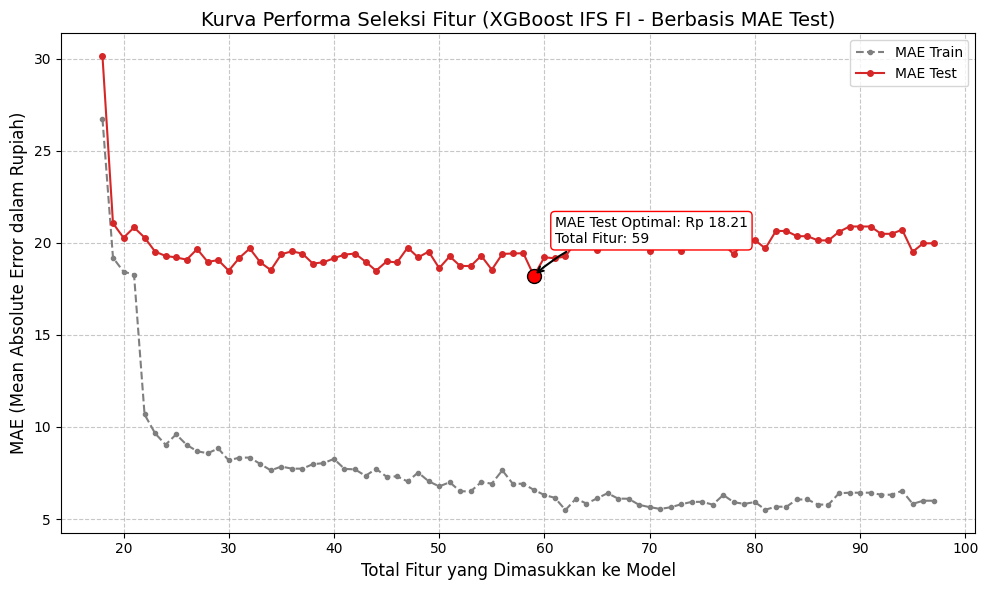


3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...

## Hasil Evaluasi Final XGBoost IFS FI ##
Train MAE: Rp 6.58
Train RMSE: Rp 14.93
Train R²: 0.8764
Test MAE: Rp 18.21
Test RMSE: Rp 26.05
Test R²: 0.6960


,Harga Aktual,Harga Prediksi,Selisih (Absolut)
0,Rp 49.48,Rp 41.92,Rp 7.56
1,Rp 48.00,Rp 49.32,Rp 1.32
2,Rp 39.00,Rp 47.00,Rp 8.00
3,Rp 50.00,Rp 39.23,Rp 10.77
4,Rp 141.00,Rp 95.86,Rp 45.14
5,Rp 150.00,Rp 48.45,Rp 101.55
6,Rp 15.00,Rp 35.88,Rp 20.88
7,Rp 190.00,Rp 106.56,Rp 83.44
8,Rp 40.00,Rp 43.70,Rp 3.70
9,Rp 58.50,Rp 46.52,Rp 11.98


In [12]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold, RandomizedSearchCV
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
import joblib

price_transformer = fitted_transformers['harga_asli']

def inverse_transform_target(values):
    if hasattr(values, 'values'):
        values = values.values
    return price_transformer.inverse_transform(np.asarray(values).reshape(-1, 1)).flatten()

def hitung_mae_asli(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    return mean_absolute_error(y_true_orig, y_pred_orig)

def hitung_metrik_regresi(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    mae = mean_absolute_error(y_true_orig, y_pred_orig)
    rmse = np.sqrt(mean_squared_error(y_true_orig, y_pred_orig))
    r2 = r2_score(y_true_orig, y_pred_orig)
    return mae, rmse, r2, y_true_orig, y_pred_orig

print("\n2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...")
train_mae_scores = []
mae_scores = []
jumlah_fitur_berjalan = []

eval_model = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)

current_features = variabel_tetap.copy()
eval_model.fit(X_train_XB[current_features], y_train_XB)
train_pred = eval_model.predict(X_train_XB[current_features])
test_pred = eval_model.predict(X_test_XB[current_features])
baseline_train_mae = hitung_mae_asli(y_train_XB, train_pred)
baseline_test_mae = hitung_mae_asli(y_test_XB, test_pred)

train_mae_scores.append(baseline_train_mae)
mae_scores.append(baseline_test_mae)
jumlah_fitur_berjalan.append(len(current_features))
print(f"Baseline | Total fitur: {len(current_features)} | MAE Train: Rp {baseline_train_mae:,.2f} | MAE Test: Rp {baseline_test_mae:,.2f}")

total_candidates = len(ranked_candidates_list)
for i in range(1, total_candidates + 1):
    current_features = variabel_tetap + ranked_candidates_list[:i]
    eval_model.fit(X_train_XB[current_features], y_train_XB)
    train_pred = eval_model.predict(X_train_XB[current_features])
    test_pred = eval_model.predict(X_test_XB[current_features])
    train_mae = hitung_mae_asli(y_train_XB, train_pred)
    test_mae = hitung_mae_asli(y_test_XB, test_pred)
    train_mae_scores.append(train_mae)
    mae_scores.append(test_mae)
    jumlah_fitur_berjalan.append(len(current_features))
    print(f"Iterasi {i}/{total_candidates} | Total fitur: {len(current_features)} | MAE Train: Rp {train_mae:,.2f} | MAE Test: Rp {test_mae:,.2f}")

min_mae = min(mae_scores)
best_index = mae_scores.index(min_mae)
best_total_num = jumlah_fitur_berjalan[best_index]
best_added_num = best_total_num - len(variabel_tetap)
best_features_final_xb = variabel_tetap + ranked_candidates_list[:best_added_num]

print(f"\n✅ SELESAI! Titik optimal ditemukan pada penggunaan total {best_total_num} fitur.")
print(f"(Rincian: {len(variabel_tetap)} Variabel Tetap + {best_added_num} Variabel Kandidat)")
print(f"Nilai MAE Test Terendah: Rp {min_mae:,.2f}")

plt.figure(figsize=(10, 6))
plt.plot(jumlah_fitur_berjalan, train_mae_scores, marker='.', linestyle='--', color='#7f7f7f', markersize=6, label='MAE Train')
plt.plot(jumlah_fitur_berjalan, mae_scores, marker='.', linestyle='-', color='#d62728', markersize=8, label='MAE Test')
plt.plot(best_total_num, min_mae, 'ro', markersize=10, markeredgecolor='black')

y_offset = (max(mae_scores) - min(mae_scores)) * 0.15
if y_offset == 0:
    y_offset = max(min_mae * 0.05, 1)

plt.annotate(
    f'MAE Test Optimal: Rp {min_mae:,.2f}\nTotal Fitur: {best_total_num}',
    xy=(best_total_num, min_mae),
    xytext=(best_total_num + 2, min_mae + y_offset),
    bbox=dict(boxstyle="round,pad=0.3", edgecolor='red', facecolor='white'),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", color='black', lw=1.5)
 )

plt.title('Kurva Performa Seleksi Fitur (XGBoost IFS FI - Berbasis MAE Test)', fontsize=14)
plt.xlabel('Total Fitur yang Dimasukkan ke Model', fontsize=12)
plt.ylabel('MAE (Mean Absolute Error dalam Rupiah)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

X_train_optimal = X_train_XB[best_features_final_xb]
X_test_optimal = X_test_XB[best_features_final_xb]

print("\n3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...")
eval_model = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)
eval_model.fit(X_train_optimal, y_train_XB)
y_pred_train_transformed = eval_model.predict(X_train_optimal)
y_pred_test_transformed = eval_model.predict(X_test_optimal)

train_mae, train_rmse, train_r2, y_train_original, y_pred_train_original = hitung_metrik_regresi(y_train_XB, y_pred_train_transformed)
test_mae, test_rmse, test_r2, y_test_original, y_pred_test_original = hitung_metrik_regresi(y_test_XB, y_pred_test_transformed)

print("\n## Hasil Evaluasi Final XGBoost IFS FI ##")
print(f"Train MAE: Rp {train_mae:,.2f}")
print(f"Train RMSE: Rp {train_rmse:,.2f}")
print(f"Train R²: {train_r2:.4f}")
print(f"Test MAE: Rp {test_mae:,.2f}")
print(f"Test RMSE: Rp {test_rmse:,.2f}")
print(f"Test R²: {test_r2:.4f}")

comparison_df = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': y_pred_test_original,
    'Selisih (Absolut)': np.abs(y_test_original - y_pred_test_original)
})

pd.options.display.float_format = 'Rp {:,.2f}'.format
display(comparison_df.head(10))

In [13]:
best_features_final_xb

['kecamatan_Balongbendo',
 'kecamatan_Buduran',
 'kecamatan_Candi',
 'kecamatan_Gedangan',
 'kecamatan_Jabon',
 'kecamatan_Krembung',
 'kecamatan_Krian',
 'kecamatan_Porong',
 'kecamatan_Prambon',
 'kecamatan_Sedati',
 'kecamatan_Sidoarjo',
 'kecamatan_Sukodono',
 'kecamatan_Taman',
 'kecamatan_Tanggulangin',
 'kecamatan_Tarik',
 'kecamatan_Tulangan',
 'kecamatan_Waru',
 'kecamatan_Wonoayu',
 'bathrooms',
 'Berperabot lengkap',
 'Gas alam',
 'dist_Terminal',
 'dist_Entry_Exit_Tol',
 'Tangki air',
 'bedroom',
 'dist_Supermarket',
 'dist_Universitas',
 'dist_Halte',
 'dist_Bandara',
 'Taman',
 'road_score',
 'Area anak-anak',
 'Listrik',
 'Tidak Ada',
 'dist_SMA_SMK',
 'Cctv',
 'dist_Fasilitas_Kesehatan',
 'Wifi',
 'dist_SMP',
 'dist_Stasiun',
 'Fully fenced',
 'dist_Mall',
 'Keamanan',
 'Jaringan internet',
 'Panggang',
 'Sebagian perabotan',
 'AC',
 'dist_Minimarket',
 'Setengah terpisah',
 'dist_SD',
 'Teras',
 'Keamanan 24 jam',
 'Pemanas ruangan',
 'Gym',
 'Dapur lengkap',
 'Kolam r

In [14]:
x_xgb_fi = jumlah_fitur_berjalan.copy()
y_xgb_fi = mae_scores.copy()

# Simpan hasil IFS FI XGBoost agar tidak tertimpa oleh proses berikutnya
best_features_final_xgb_fi = best_features_final_xb.copy()

from pathlib import Path
output_dir = Path('output_data')
output_dir.mkdir(parents=True, exist_ok=True)

pd.DataFrame({
    'n_features': x_xgb_fi,
    'mae_test': y_xgb_fi
}).to_csv(output_dir / 'ifs_curve_xgb_fi.csv', index=False)

pd.DataFrame({
    'selected_feature': best_features_final_xgb_fi
}).to_csv(output_dir / 'selected_features_xgb_fi.csv', index=False)

print('Tersimpan: ifs_curve_xgb_fi.csv dan selected_features_xgb_fi.csv')

Tersimpan: ifs_curve_xgb_fi.csv dan selected_features_xgb_fi.csv


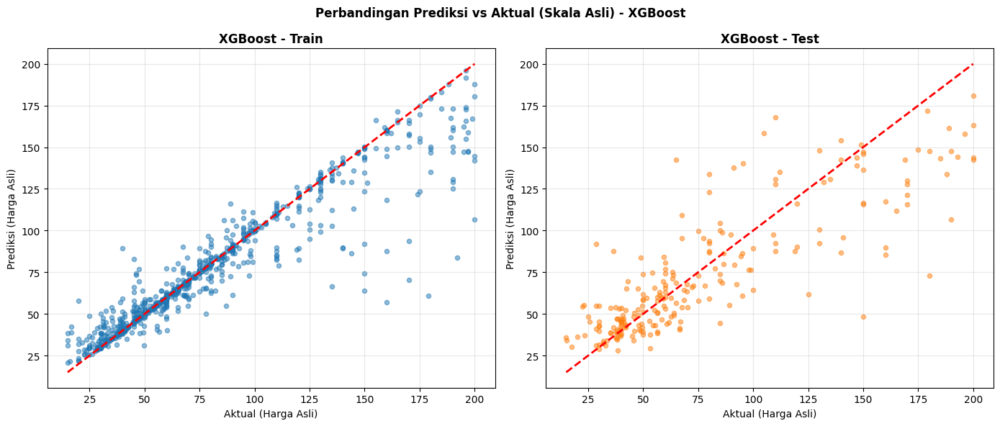

In [15]:
# Perbandingan Prediksi vs Aktual (Skala Asli) - XGBoost
import matplotlib.pyplot as plt

# Fallback nama variabel agar kompatibel dengan sel evaluasi IFS
if 'y_train_orig' in globals():
    y_train_plot = globals()['y_train_orig']
elif 'y_train_original' in globals():
    y_train_plot = globals()['y_train_original']
else:
    raise NameError("Variabel train aktual XGBoost tidak ditemukan")

if 'y_pred_train_orig' in globals():
    y_pred_train_plot = globals()['y_pred_train_orig']
elif 'y_pred_train_original' in globals():
    y_pred_train_plot = globals()['y_pred_train_original']
else:
    raise NameError("Variabel train prediksi XGBoost tidak ditemukan")

if 'y_test_orig' in globals():
    y_test_plot = globals()['y_test_orig']
elif 'y_test_original' in globals():
    y_test_plot = globals()['y_test_original']
else:
    raise NameError("Variabel test aktual XGBoost tidak ditemukan")

if 'y_pred_test_orig' in globals():
    y_pred_test_plot = globals()['y_pred_test_orig']
elif 'y_pred_test_original' in globals():
    y_pred_test_plot = globals()['y_pred_test_original']
else:
    raise NameError("Variabel test prediksi XGBoost tidak ditemukan")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Train plot
axes[0].scatter(y_train_plot, y_pred_train_plot, alpha=0.5, s=20, color='#1f77b4')
min_train = min(y_train_plot.min(), y_pred_train_plot.min())
max_train = max(y_train_plot.max(), y_pred_train_plot.max())
axes[0].plot([min_train, max_train], [min_train, max_train], 'r--', linewidth=2)
axes[0].set_title('XGBoost - Train', fontweight='bold')
axes[0].set_xlabel('Aktual (Harga Asli)')
axes[0].set_ylabel('Prediksi (Harga Asli)')
axes[0].grid(alpha=0.3)

# Test plot
axes[1].scatter(y_test_plot, y_pred_test_plot, alpha=0.5, s=20, color='#ff7f0e')
min_test = min(y_test_plot.min(), y_pred_test_plot.min())
max_test = max(y_test_plot.max(), y_pred_test_plot.max())
axes[1].plot([min_test, max_test], [min_test, max_test], 'r--', linewidth=2)
axes[1].set_title('XGBoost - Test', fontweight='bold')
axes[1].set_xlabel('Aktual (Harga Asli)')
axes[1].set_ylabel('Prediksi (Harga Asli)')
axes[1].grid(alpha=0.3)

plt.suptitle('Perbandingan Prediksi vs Aktual (Skala Asli) - XGBoost', fontweight='bold')
plt.tight_layout()
plt.show()

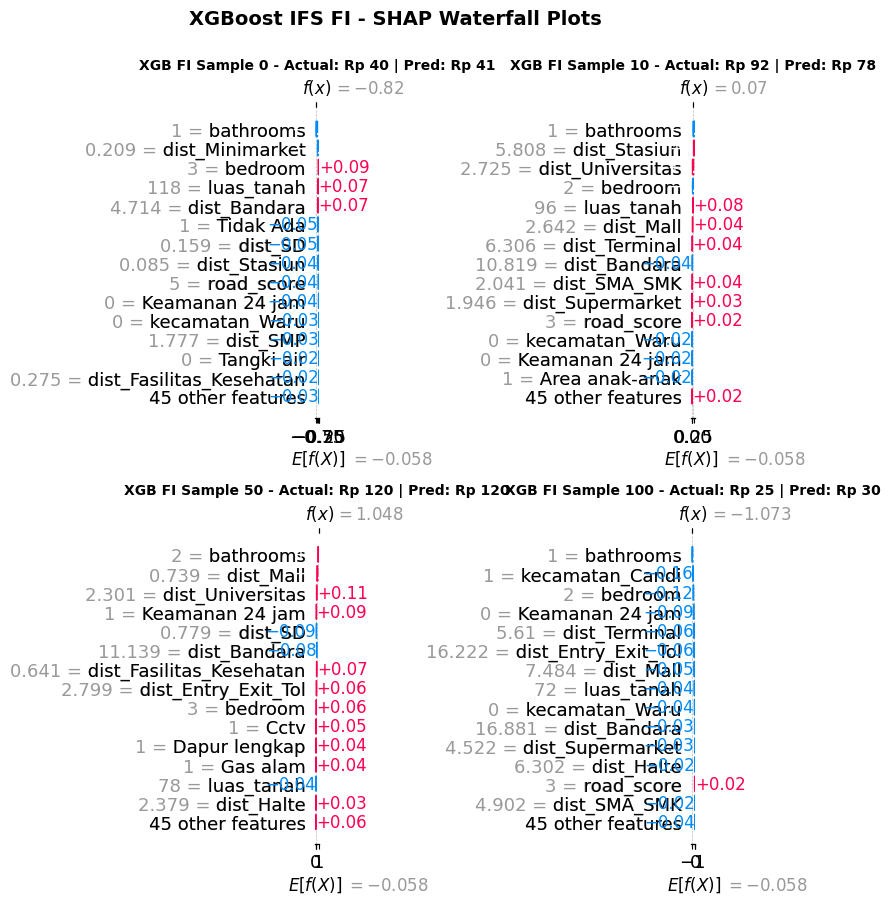

In [16]:
# FI XGBoost - Waterfall Plot dan Feature Impact Distribution (gaya SHAP)
if 'best_features_final_xgb_fi' in globals() and 'X_train_XB' in globals() and 'y_train_XB' in globals():
    # Fit ulang model FI agar independen dari urutan eksekusi sel
    fi_model_xgb = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)
    fi_model_xgb.fit(X_train_XB[best_features_final_xgb_fi], y_train_XB)

    n_samples_fi = min(500, len(X_train_XB))
    sample_idx_fi = X_train_XB.sample(n_samples_fi, random_state=42).index
    X_fi_sample_xgb = X_train_XB.loc[sample_idx_fi, best_features_final_xgb_fi].copy()
    y_fi_sample_xgb = y_train_XB.loc[sample_idx_fi].copy()

    explainer_fi_xgb = shap.TreeExplainer(fi_model_xgb)
    shap_values_fi_xgb = explainer_fi_xgb.shap_values(X_fi_sample_xgb)
    expected_value_fi_xgb = explainer_fi_xgb.expected_value

    pred_fi_xgb = fi_model_xgb.predict(X_fi_sample_xgb)
    actual_fi_xgb = inverse_transform_target(y_fi_sample_xgb)
    pred_fi_xgb_original = inverse_transform_target(pred_fi_xgb)

    # Waterfall plot (4 contoh)
    sample_positions = [0, 10, 50, 100]
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for i, idx in enumerate(sample_positions):
        if idx < len(X_fi_sample_xgb):
            plt.sca(axes[i])
            shap.waterfall_plot(
                shap.Explanation(
                    values=shap_values_fi_xgb[idx],
                    base_values=float(expected_value_fi_xgb),
                    data=X_fi_sample_xgb.iloc[idx].values,
                    feature_names=X_fi_sample_xgb.columns.tolist()
                ),
                max_display=15,
                show=False
            )
            axes[i].set_title(
                f'XGB FI Sample {idx} - Actual: Rp {actual_fi_xgb[idx]:,.0f} | Pred: Rp {pred_fi_xgb_original[idx]:,.0f}',
                fontsize=10, fontweight='bold'
            )

    plt.suptitle('XGBoost IFS FI - SHAP Waterfall Plots', fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()

    # Feature impact distribution (beeswarm)
    

    

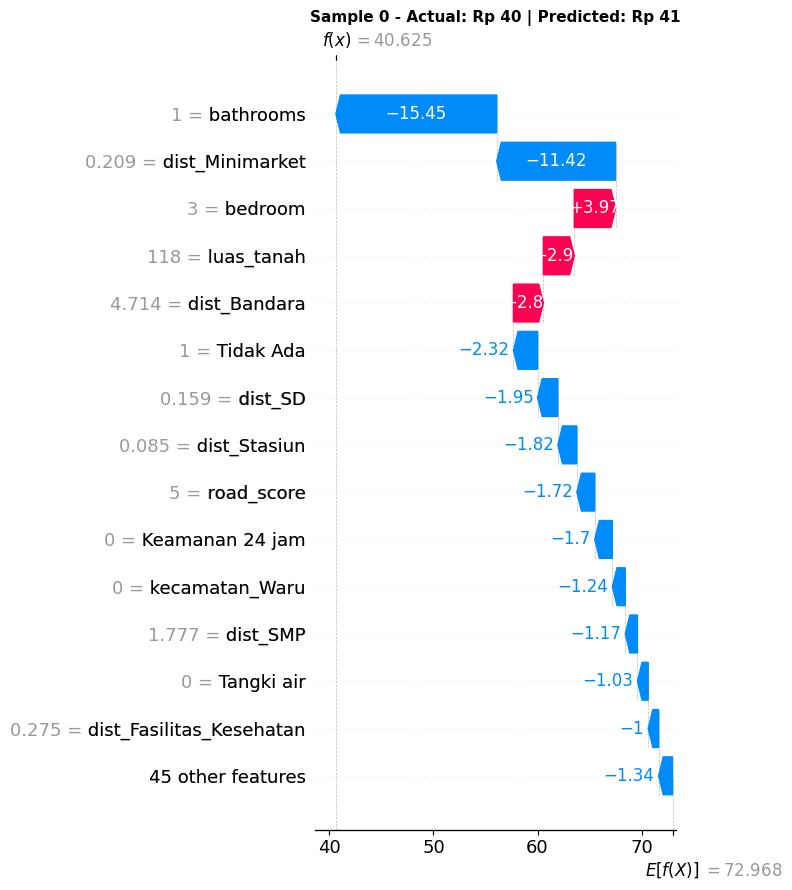

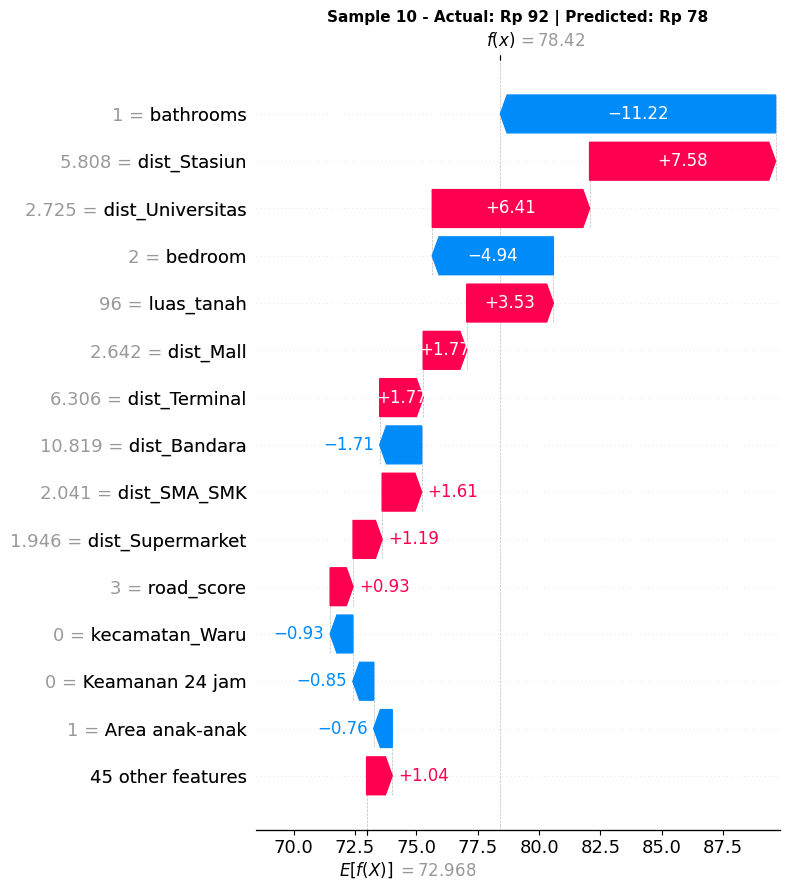

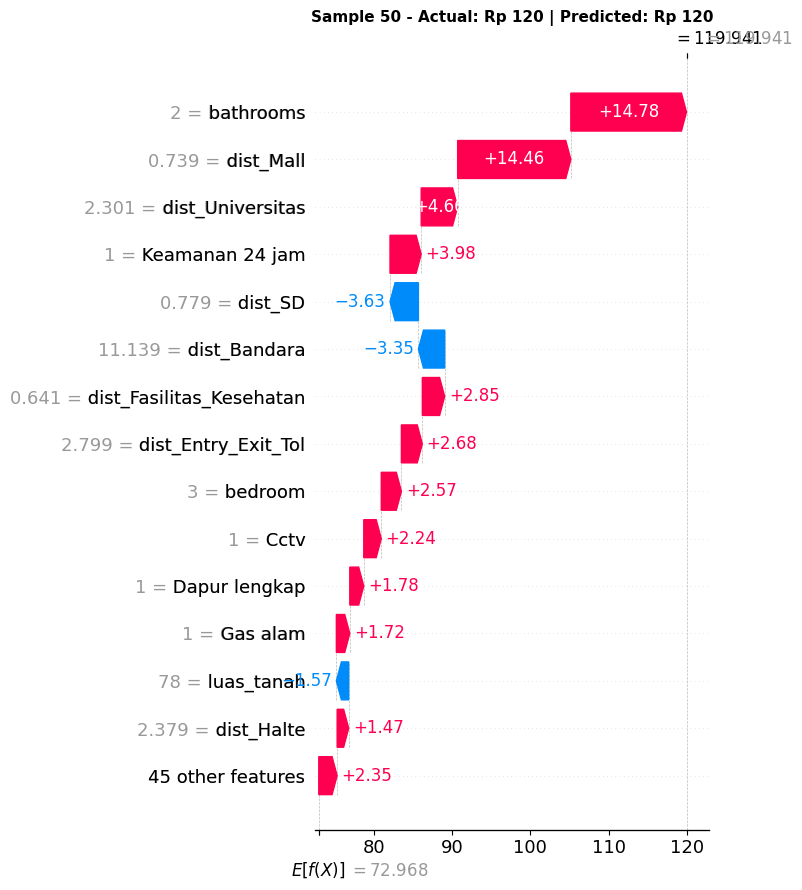

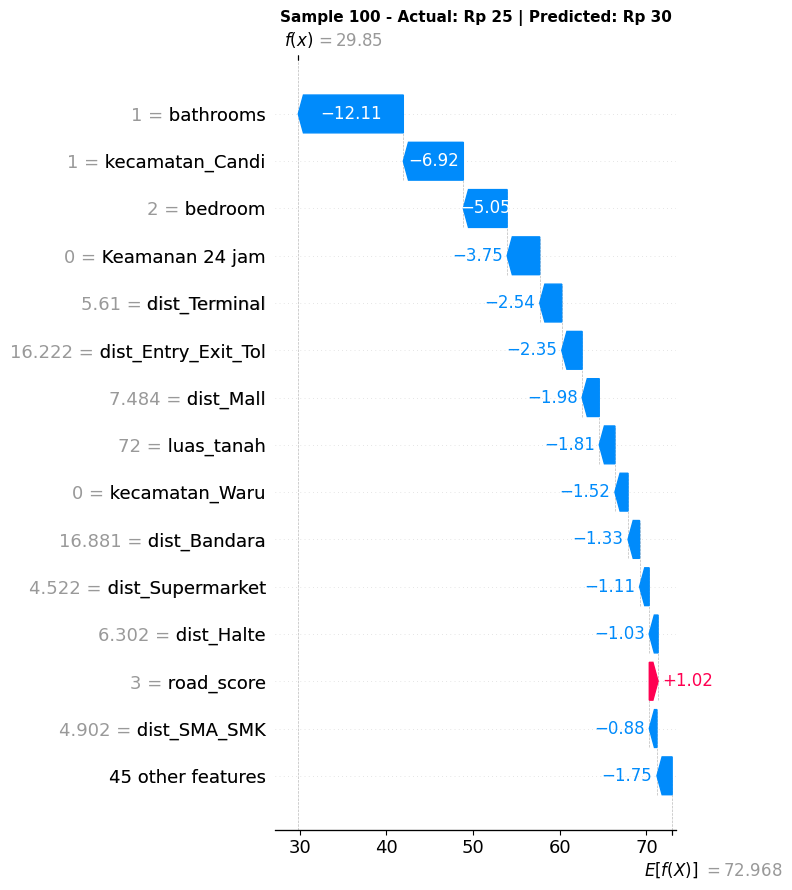

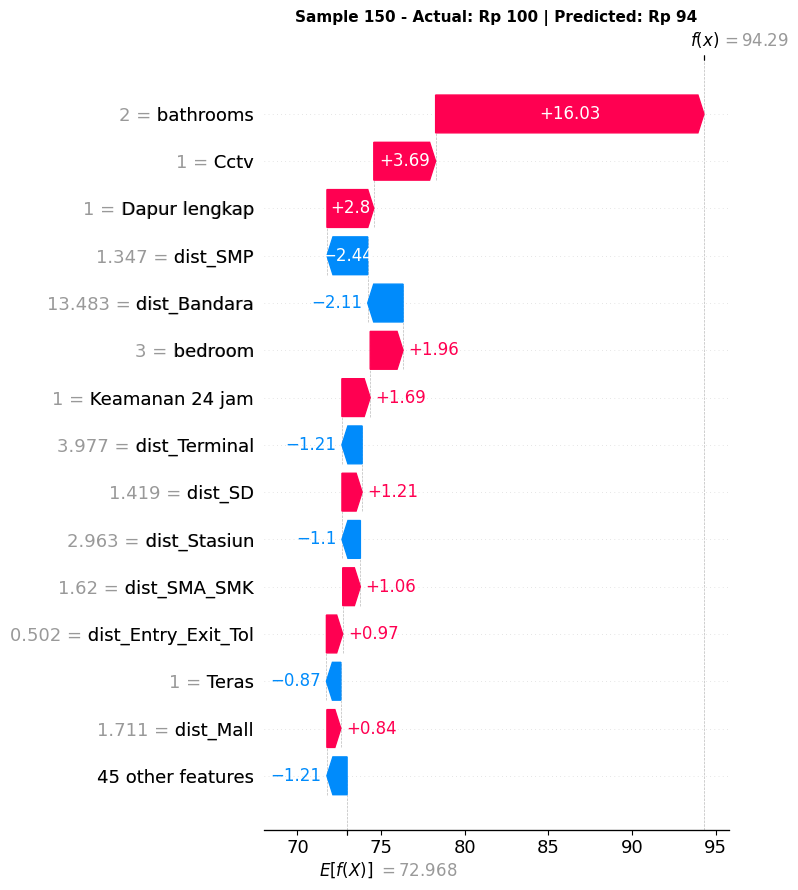

In [17]:
# FI XGBoost - Waterfall Plot dan Feature Impact Distribution (gaya SHAP)
if 'best_features_final_xgb_fi' in globals() and 'X_train_XB' in globals() and 'y_train_XB' in globals():
    # Fit ulang model FI agar independen dari urutan eksekusi sel
    fi_model_xgb = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)
    fi_model_xgb.fit(X_train_XB[best_features_final_xgb_fi], y_train_XB)

    n_samples_fi = min(500, len(X_train_XB))
    sample_idx_fi = X_train_XB.sample(n_samples_fi, random_state=42).index
    X_fi_sample_xgb = X_train_XB.loc[sample_idx_fi, best_features_final_xgb_fi].copy()
    y_fi_sample_xgb = y_train_XB.loc[sample_idx_fi].copy()

    explainer_fi_xgb = shap.TreeExplainer(fi_model_xgb)
    shap_values_fi_xgb = explainer_fi_xgb.shap_values(X_fi_sample_xgb)
    expected_value_fi_xgb = explainer_fi_xgb.expected_value

    pred_fi_xgb = fi_model_xgb.predict(X_fi_sample_xgb)
    actual_fi_xgb = inverse_transform_target(y_fi_sample_xgb)
    pred_fi_xgb_original = inverse_transform_target(pred_fi_xgb)

    # SHAP Waterfall Plot - Output satu per satu (5 sampel) dalam skala rupiah asli
    if shap_values_fi_xgb is not None and expected_value_fi_xgb is not None:
        sample_idx = [0, 10, 50, 100, 150]  # 5 contoh
        scale_target = float(price_transformer.std_) if 'price_transformer' in globals() else 1.0
        mean_target = float(price_transformer.mean_) if 'price_transformer' in globals() else 0.0

        for idx in sample_idx:
            if idx < len(X_fi_sample_xgb):
                plt.figure(figsize=(10, 6))  # Buat figure baru tiap loop

                shap_values_rp = np.asarray(shap_values_fi_xgb[idx]) * scale_target
                base_value_rp = float(expected_value_fi_xgb) * scale_target + mean_target

                shap.waterfall_plot(
                    shap.Explanation(
                        values=shap_values_rp,
                        base_values=base_value_rp,
                        data=X_fi_sample_xgb.iloc[idx].values,
                        feature_names=X_fi_sample_xgb.columns.tolist()
                    ),
                    max_display=15,
                    show=False
                )

                actual_price = actual_fi_xgb[idx]
                predicted_price = pred_fi_xgb_original[idx]

                plt.title(
                    f'Sample {idx} - Actual: Rp {actual_price:,.0f} | Predicted: Rp {predicted_price:,.0f}',
                    fontsize=11,
                    fontweight='bold'
                )

                plt.tight_layout()
                plt.show()  # tampilkan satu-satu
    else:
        print("⚠ SHAP values not available. Skipping waterfall plots.")

else:
    print("⚠ Variabel IFS FI XGBoost belum tersedia. Jalankan dulu blok IFS FI XGBoost.")

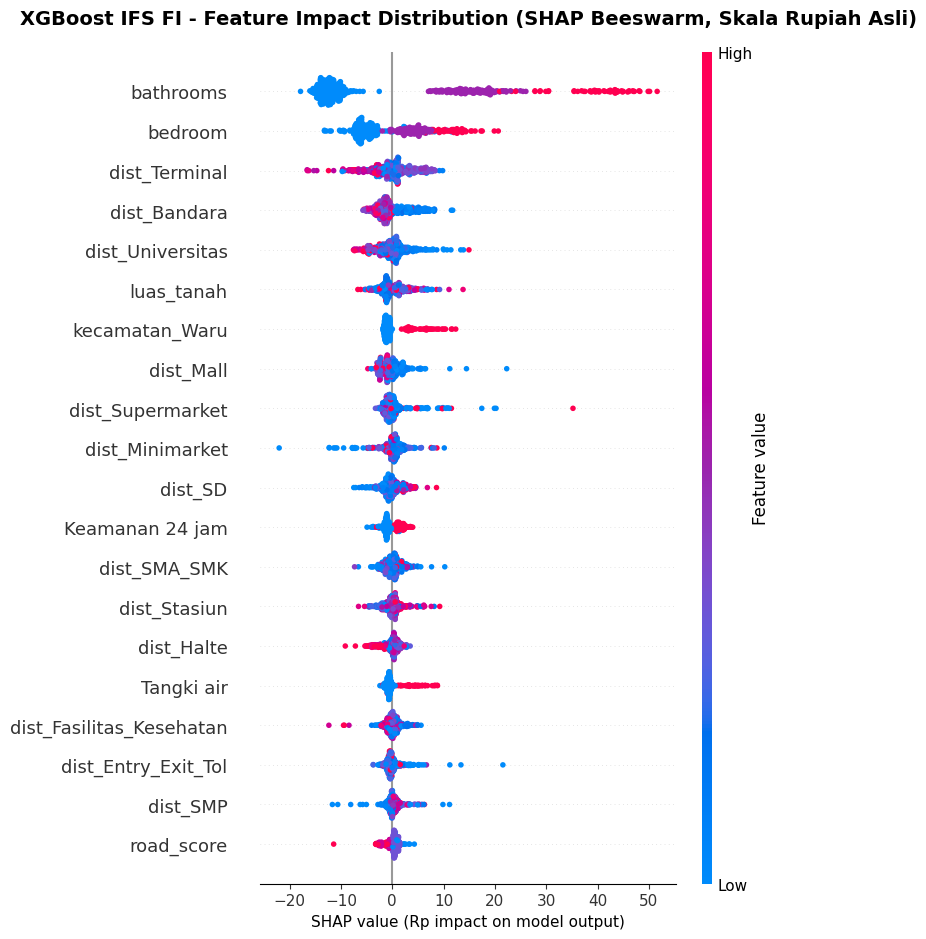

In [18]:
scale_target = float(price_transformer.std_) if 'price_transformer' in globals() else 1.0
shap_values_fi_xgb_rp = np.asarray(shap_values_fi_xgb) * scale_target

plt.figure(figsize=(12, 8))
shap.summary_plot(
    shap_values_fi_xgb_rp,
    X_fi_sample_xgb,
    feature_names=X_fi_sample_xgb.columns.tolist(),
    max_display=20,
    show=False
    )
plt.title('XGBoost IFS FI - Feature Impact Distribution (SHAP Beeswarm, Skala Rupiah Asli)', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('SHAP value (Rp impact on model output)', fontsize=11)
plt.tight_layout()
plt.show()

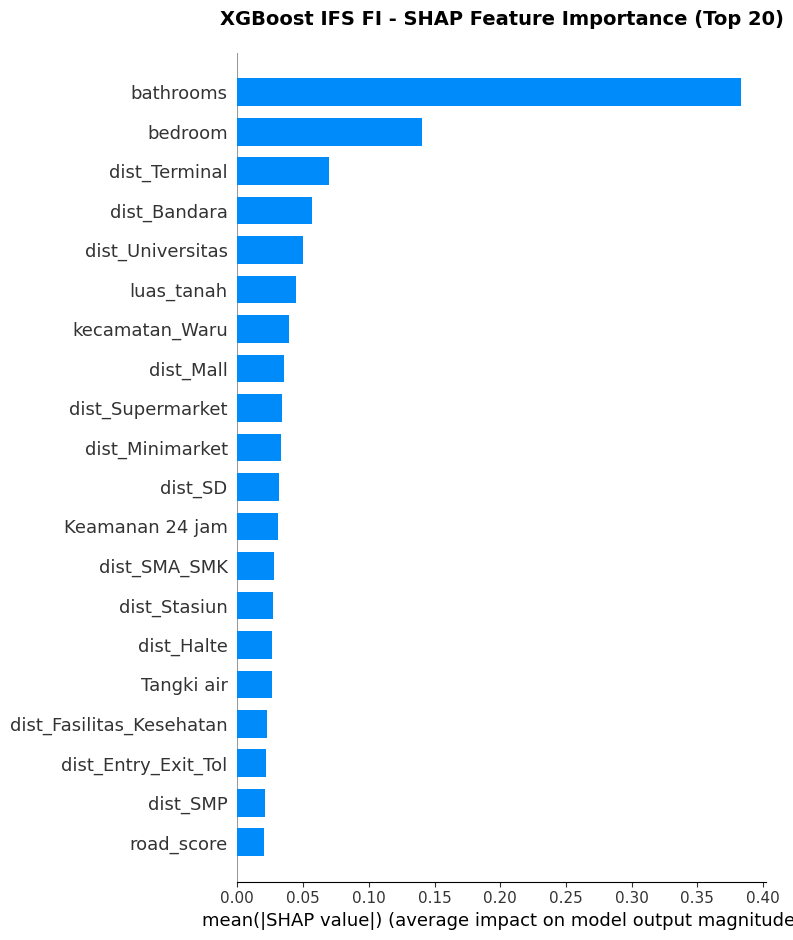

In [30]:
# Feature importance bar
plt.figure(figsize=(12, 8))
shap.summary_plot(
    shap_values_fi_xgb,
    X_fi_sample_xgb,
    feature_names=X_fi_sample_xgb.columns.tolist(),
    plot_type="bar",
    max_display=20,
    show=False
    )
plt.title('XGBoost IFS FI - SHAP Feature Importance (Top 20)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

In [15]:
importance = pd.DataFrame({
    "feature": X_train_XB.columns,
    "importance": best_model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance.head(20))

                     feature  importance
1                  bathrooms     Rp 0.19
0                    bedroom     Rp 0.08
60            Area anak-anak     Rp 0.05
31                  Gas alam     Rp 0.04
88          kecamatan_Sedati     Rp 0.04
15             dist_Terminal     Rp 0.03
95            kecamatan_Waru     Rp 0.03
11                 dist_Mall     Rp 0.03
16              dist_Bandara     Rp 0.03
17                dist_Halte     Rp 0.03
14              dist_Stasiun     Rp 0.02
12          dist_Supermarket     Rp 0.02
89        kecamatan_Sidoarjo     Rp 0.02
2        jumlah_guest_toilet     Rp 0.02
18       dist_Entry_Exit_Tol     Rp 0.02
7                   dist_SMP     Rp 0.02
54                Tangki air     Rp 0.02
6                    dist_SD     Rp 0.02
10  dist_Fasilitas_Kesehatan     Rp 0.02
19                road_score     Rp 0.02


In [17]:
importance.to_csv('/kaggle/working/1_feature_importance_XGB.csv', index=False)

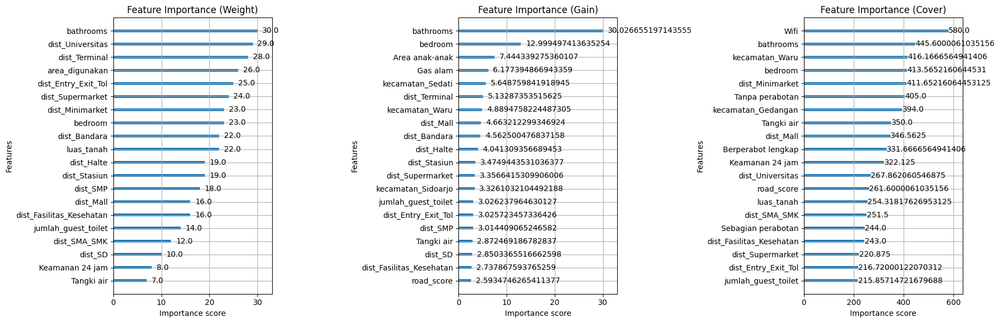


Top 20 Features (Average of Weight, Gain, Cover):
                     feature  importance_weight  importance_gain  \
15                      Wifi            Rp 1.00          Rp 1.56   
17                 bathrooms           Rp 30.00         Rp 30.03   
18                   bedroom           Rp 23.00         Rp 13.00   
24           dist_Minimarket           Rp 23.00          Rp 2.37   
36            kecamatan_Waru            Rp 6.00          Rp 4.89   
13           Tanpa perabotan            Rp 3.00          Rp 1.97   
33        kecamatan_Gedangan            Rp 2.00          Rp 2.35   
23                 dist_Mall           Rp 16.00          Rp 4.66   
12                Tangki air            Rp 7.00          Rp 2.87   
2         Berperabot lengkap            Rp 3.00          Rp 2.17   
8            Keamanan 24 jam            Rp 8.00          Rp 2.16   
31          dist_Universitas           Rp 29.00          Rp 2.50   
37                luas_tanah           Rp 22.00          Rp 2.39 

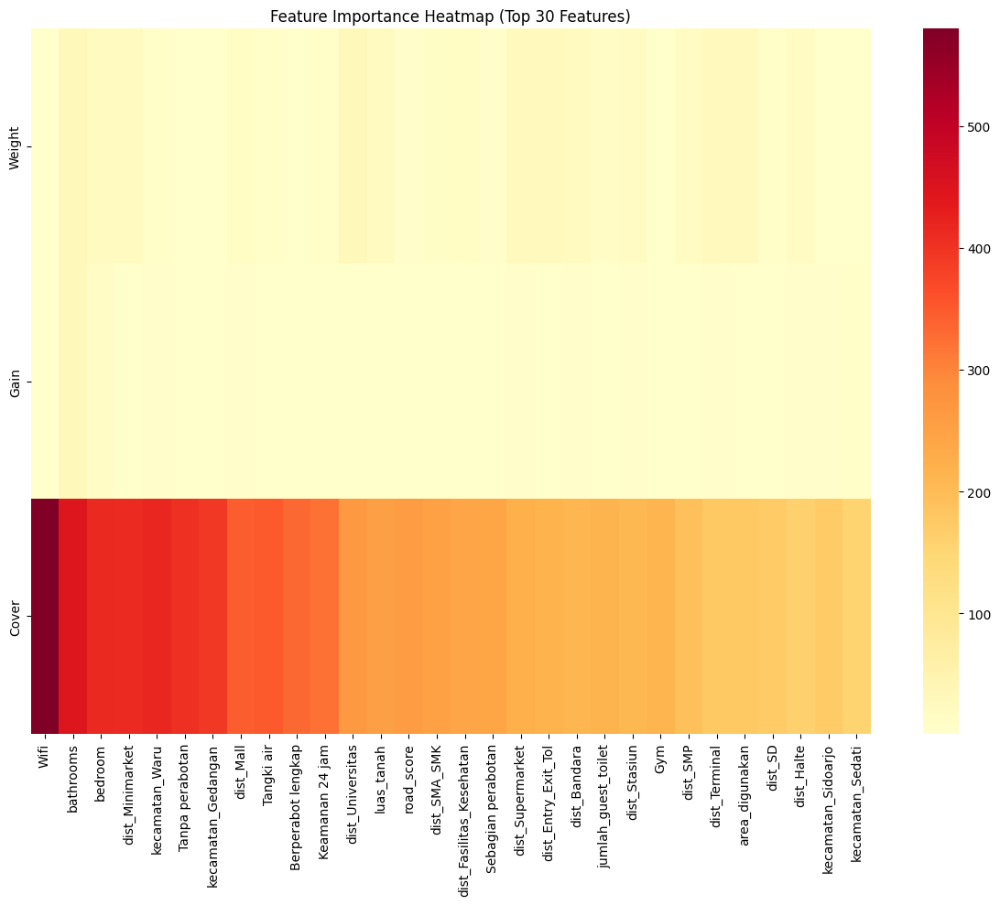

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import plot_importance

# Method 1: XGBoost plot_importance
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Weight importance
plot_importance(best_model, importance_type='weight', max_num_features=20, ax=axes[0])
axes[0].set_title('Feature Importance (Weight)')

# Gain importance
plot_importance(best_model, importance_type='gain', max_num_features=20, ax=axes[1])
axes[1].set_title('Feature Importance (Gain)')

# Cover importance
plot_importance(best_model, importance_type='cover', max_num_features=20, ax=axes[2])
axes[2].set_title('Feature Importance (Cover)')

plt.tight_layout()
plt.show()

# Method 2: Custom DataFrame Analysis
importance_types = ['weight', 'gain', 'cover']
importance_df = pd.DataFrame()

for imp_type in importance_types:
    booster = best_model.get_booster()
    importance_dict = booster.get_score(importance_type=imp_type)
    temp_df = pd.DataFrame({
        'feature': list(importance_dict.keys()),
        f'importance_{imp_type}': list(importance_dict.values())
    })
    if importance_df.empty:
        importance_df = temp_df
    else:
        importance_df = importance_df.merge(temp_df, on='feature', how='outer')

importance_df = importance_df.fillna(0)
importance_df['avg_importance'] = importance_df[[f'importance_{t}' for t in importance_types]].mean(axis=1)
importance_df = importance_df.sort_values('avg_importance', ascending=False)

print("\nTop 20 Features (Average of Weight, Gain, Cover):")
print(importance_df.head(20))

# Heatmap
plt.figure(figsize=(12, 10))
top_features = importance_df.head(30)
heatmap_data = top_features[[f'importance_{t}' for t in importance_types]].T
sns.heatmap(heatmap_data, 
            xticklabels=top_features['feature'],
            yticklabels=['Weight', 'Gain', 'Cover'],
            cmap='YlOrRd',
            annot=False,
            fmt='.2f')
plt.title('Feature Importance Heatmap (Top 30 Features)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [19]:
importance_df.to_csv('/kaggle/working/2_feature_importance_XGB_detailed.csv', index=False)

# IFS SHAP XGB

In [20]:
# SHAP Analysis untuk XGBoost
# Solusi FINAL: Menggunakan numpy array dan xgboost.Booster untuk menghindari semua error

import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SHAP ANALYSIS - XGBOOST MODEL")
print("="*80)

# Step 1: Ambil sample data untuk efisiensi komputasi
print("\n[1/6] Preparing data for SHAP analysis...")
n_samples = min(1000, len(X_train_XB))
sample_indices = X_train_XB.sample(n_samples, random_state=42).index
X_shap_sample = X_train_XB.loc[sample_indices].copy()
y_shap_sample = y_train_XB.loc[sample_indices].copy()

# Simpan nama kolom untuk nanti
feature_names = X_shap_sample.columns.tolist()

# Convert ke numpy array (menghindari masalah feature_names_in_)
X_shap_np = X_shap_sample.values
y_shap_np = y_shap_sample.values

print(f"   Sample size: {X_shap_np.shape}")
print(f"   Features: {len(feature_names)}")

# Step 2: Buat model baru dengan sklearn-compatible approach
print("\n[2/6] Creating fresh XGBoost model for SHAP...")
best_params = random_search.best_params_.copy()

# Buat model tanpa feature names (pure numpy)
import xgboost as xgb

# Gunakan DMatrix untuk kontrol penuh
dtrain = xgb.DMatrix(X_shap_np, label=y_shap_np, feature_names=feature_names)

# Parameter untuk training
xgb_params = {
    'objective': 'reg:squarederror',
    'tree_method': 'hist',
    'max_depth': best_params.get('max_depth', 4),
    'learning_rate': best_params.get('learning_rate', 0.01),
    'subsample': best_params.get('subsample', 0.7),
    'colsample_bytree': best_params.get('colsample_bytree', 0.7),
    'min_child_weight': best_params.get('min_child_weight', 2),
    'gamma': best_params.get('gamma', 3),
    'reg_alpha': best_params.get('reg_alpha', 0.4),
    'reg_lambda': best_params.get('reg_lambda', 2.5),
    'seed': 42,
    'verbosity': 0
}

n_estimators = best_params.get('n_estimators', 500)
print(f"   Params: max_depth={xgb_params['max_depth']}, n_estimators={n_estimators}")

# Step 3: Train model
print("\n[3/6] Training XGBoost model...")
booster = xgb.train(xgb_params, dtrain, num_boost_round=n_estimators)
print("   ✓ Model trained successfully")

# Step 4: Verify model performance
print("\n[4/6] Verifying model performance...")
train_pred = booster.predict(dtrain)
train_rmse = np.sqrt(mean_squared_error(y_shap_np, train_pred))
train_mae = mean_absolute_error(y_shap_np, train_pred)
print(f"   RMSE: Rp {train_rmse:,.0f}")
print(f"   MAE: Rp {train_mae:,.0f}")

# Step 5: Create SHAP explainer dengan Booster
print("\n[5/6] Creating SHAP TreeExplainer...")
shap_success = False
shap_values = None
explainer = None
expected_value = None

try:
    
    # Method: Gunakan TreeExplainer dengan booster langsung
    explainer = shap.TreeExplainer(booster)
    expected_value = explainer.expected_value
    print("   ✓ TreeExplainer created successfully")
    shap_success = True
except Exception as e:
    print(f"   ✗ TreeExplainer failed: {str(e)[:100]}")
    
    # Fallback: Gunakan predict function untuk KernelExplainer
    try:
        print("   Trying KernelExplainer with predict function...")
        
        def predict_fn(X):
            dmatrix = xgb.DMatrix(X, feature_names=feature_names)
            return booster.predict(dmatrix)
        
        background = X_shap_np[np.random.choice(len(X_shap_np), min(100, len(X_shap_np)), replace=False)]
        explainer = shap.KernelExplainer(predict_fn, background)
        expected_value = explainer.expected_value
        print("   ✓ KernelExplainer created successfully")
        shap_success = True
    except Exception as e2:
        print(f"   ✗ KernelExplainer failed: {str(e2)[:100]}")

# Step 6: Calculate SHAP values
if shap_success and explainer is not None:
    print("\n[6/6] Calculating SHAP values...")
    try:
        if isinstance(explainer, shap.TreeExplainer):
            shap_values = explainer.shap_values(dtrain)
        else:
            # KernelExplainer
            shap_values = explainer.shap_values(X_shap_np, nsamples=100, silent=True)
        
        print(f"   ✓ SHAP values calculated!")
        print(f"   Shape: {shap_values.shape}")
        print(f"   Base value: Rp {float(expected_value):,.0f}")
        print("\n" + "="*80)
        print("✓ SHAP ANALYSIS COMPLETED SUCCESSFULLY!")
        print("="*80)
    except Exception as e:
        print(f"\n   ✗ Failed to calculate SHAP values: {e}")
        shap_success = False
        shap_values = None
else:
    print("\n" + "="*80)
    print("✗ SHAP ANALYSIS FAILED - Using Permutation Importance instead")
    print("="*80)
    shap_values = None

# Alias agar sel visualisasi berikutnya tetap kompatibel
shap_values_original = shap_values if 'shap_values' in locals() else None
expected_value_original = expected_value if 'expected_value' in locals() else None
train_pred_original = inverse_transform_target(train_pred) if 'train_pred' in locals() else None
X_shap_target_original = inverse_transform_target(y_shap_sample) if 'y_shap_sample' in locals() else None

SHAP ANALYSIS - XGBOOST MODEL

[1/6] Preparing data for SHAP analysis...
   Sample size: (916, 97)
   Features: 97

[2/6] Creating fresh XGBoost model for SHAP...
   Params: max_depth=6, n_estimators=348

[3/6] Training XGBoost model...
   ✓ Model trained successfully

[4/6] Verifying model performance...
   RMSE: Rp 0
   MAE: Rp 0

[5/6] Creating SHAP TreeExplainer...
   ✓ TreeExplainer created successfully

[6/6] Calculating SHAP values...
   ✓ SHAP values calculated!
   Shape: (916, 97)
   Base value: Rp -0

✓ SHAP ANALYSIS COMPLETED SUCCESSFULLY!


Jumlah variabel tetap (Kecamatan): 18
Jumlah variabel kandidat (Akan diseleksi): 79

1. Sedang merangking fitur kandidat menggunakan SHAP Value...
   Menghitung SHAP values (ini mungkin memakan waktu beberapa detik)...
   ✓ SHAP Ranking Selesai! Fitur kandidat teratas: bathrooms

2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...
Baseline | Total fitur: 18 | MAE Train: Rp 26.73 | MAE Test: Rp 30.13
Iterasi 1/79 | Total fitur: 19 | MAE Train: Rp 19.19 | MAE Test: Rp 21.06
Iterasi 2/79 | Total fitur: 20 | MAE Train: Rp 17.22 | MAE Test: Rp 20.90
Iterasi 3/79 | Total fitur: 21 | MAE Train: Rp 11.22 | MAE Test: Rp 19.73
Iterasi 4/79 | Total fitur: 22 | MAE Train: Rp 10.10 | MAE Test: Rp 19.53
Iterasi 5/79 | Total fitur: 23 | MAE Train: Rp 10.00 | MAE Test: Rp 19.84
Iterasi 6/79 | Total fitur: 24 | MAE Train: Rp 10.39 | MAE Test: Rp 19.06
Iterasi 7/79 | Total fitur: 25 | MAE Train: Rp 8.15 | MAE Test: Rp 19.58
Iterasi 8/79 | Total fitur: 26 | MAE Train: Rp 8.95 | MAE Test: Rp 19

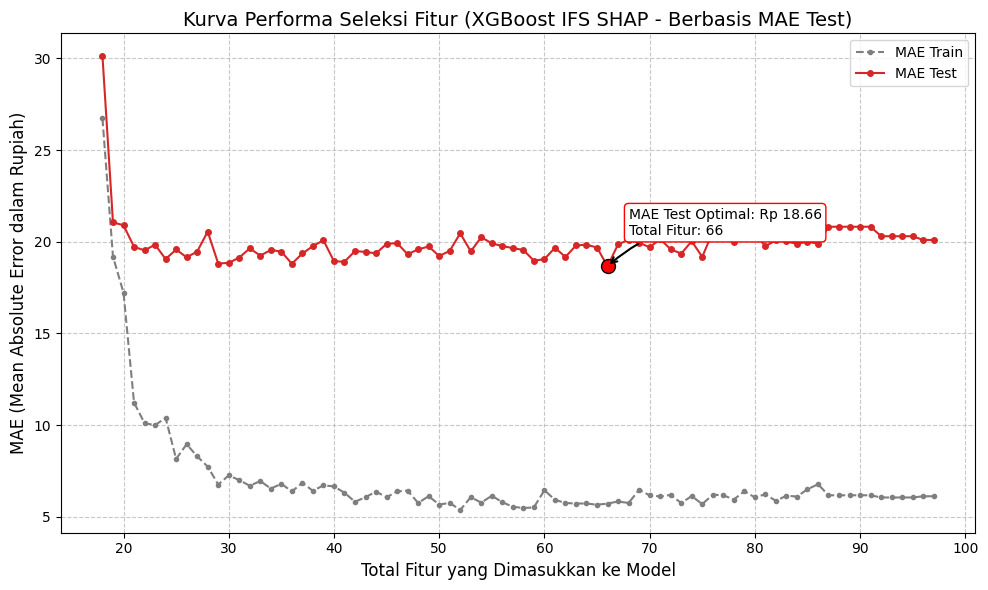


3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...

## Hasil Evaluasi Final XGBoost IFS SHAP ##
Train MAE: Rp 5.72
Train RMSE: Rp 13.66
Train R²: 0.8965
Test MAE: Rp 18.66
Test RMSE: Rp 27.71
Test R²: 0.6559


,Harga Aktual,Harga Prediksi,Selisih (Absolut)
0,Rp 49.48,Rp 37.94,Rp 11.54
1,Rp 48.00,Rp 44.04,Rp 3.96
2,Rp 39.00,Rp 54.59,Rp 15.59
3,Rp 50.00,Rp 38.57,Rp 11.43
4,Rp 141.00,Rp 91.90,Rp 49.10
5,Rp 150.00,Rp 48.38,Rp 101.62
6,Rp 15.00,Rp 42.93,Rp 27.93
7,Rp 190.00,Rp 100.21,Rp 89.79
8,Rp 40.00,Rp 46.85,Rp 6.85
9,Rp 58.50,Rp 57.61,Rp 0.89


In [21]:
import shap
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold, RandomizedSearchCV
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
import joblib

variabel_tetap = [col for col in X_train_XB.columns if col.startswith('kecamatan_')]
variabel_kandidat = [col for col in X_train_XB.columns if col not in variabel_tetap]

print(f"Jumlah variabel tetap (Kecamatan): {len(variabel_tetap)}")
print(f"Jumlah variabel kandidat (Akan diseleksi): {len(variabel_kandidat)}")
print("\n1. Sedang merangking fitur kandidat menggunakan SHAP Value...")

rank_model = XGBRegressor(objective="reg:absoluteerror", random_state=42, n_jobs=-1)
rank_model.fit(X_train_XB, y_train_XB)
print("   Menghitung SHAP values (ini mungkin memakan waktu beberapa detik)...")
explainer = shap.TreeExplainer(rank_model)
shap_values = explainer.shap_values(X_train_XB)
mean_abs_shap = np.abs(shap_values).mean(axis=0)
feat_imp_dict = dict(zip(X_train_XB.columns, mean_abs_shap))
candidate_imp = {feat: feat_imp_dict[feat] for feat in variabel_kandidat}
ranked_candidates = sorted(candidate_imp.items(), key=lambda x: x[1], reverse=True)
ranked_candidates_list = [f[0] for f in ranked_candidates]
print(f"   ✓ SHAP Ranking Selesai! Fitur kandidat teratas: {ranked_candidates_list[0]}")

price_transformer = fitted_transformers['harga_asli']

def inverse_transform_target(values):
    if hasattr(values, 'values'):
        values = values.values
    return price_transformer.inverse_transform(np.asarray(values).reshape(-1, 1)).flatten()

def hitung_mae_asli(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    return mean_absolute_error(y_true_orig, y_pred_orig)

def hitung_metrik_regresi(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    mae = mean_absolute_error(y_true_orig, y_pred_orig)
    rmse = np.sqrt(mean_squared_error(y_true_orig, y_pred_orig))
    r2 = r2_score(y_true_orig, y_pred_orig)
    return mae, rmse, r2, y_true_orig, y_pred_orig

print("\n2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...")
train_mae_scores = []
mae_scores = []
jumlah_fitur_berjalan = []

eval_model = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)

current_features = variabel_tetap.copy()
eval_model.fit(X_train_XB[current_features], y_train_XB)
train_pred = eval_model.predict(X_train_XB[current_features])
test_pred = eval_model.predict(X_test_XB[current_features])
baseline_train_mae = hitung_mae_asli(y_train_XB, train_pred)
baseline_test_mae = hitung_mae_asli(y_test_XB, test_pred)

train_mae_scores.append(baseline_train_mae)
mae_scores.append(baseline_test_mae)
jumlah_fitur_berjalan.append(len(current_features))
print(f"Baseline | Total fitur: {len(current_features)} | MAE Train: Rp {baseline_train_mae:,.2f} | MAE Test: Rp {baseline_test_mae:,.2f}")

total_candidates = len(ranked_candidates_list)
for i in range(1, total_candidates + 1):
    current_features = variabel_tetap + ranked_candidates_list[:i]
    eval_model.fit(X_train_XB[current_features], y_train_XB)
    train_pred = eval_model.predict(X_train_XB[current_features])
    test_pred = eval_model.predict(X_test_XB[current_features])
    train_mae = hitung_mae_asli(y_train_XB, train_pred)
    test_mae = hitung_mae_asli(y_test_XB, test_pred)
    train_mae_scores.append(train_mae)
    mae_scores.append(test_mae)
    jumlah_fitur_berjalan.append(len(current_features))
    print(f"Iterasi {i}/{total_candidates} | Total fitur: {len(current_features)} | MAE Train: Rp {train_mae:,.2f} | MAE Test: Rp {test_mae:,.2f}")

min_mae = min(mae_scores)
best_index = mae_scores.index(min_mae)
best_total_num = jumlah_fitur_berjalan[best_index]
best_added_num = best_total_num - len(variabel_tetap)
best_features_final_xb = variabel_tetap + ranked_candidates_list[:best_added_num]

print(f"\n✅ SELESAI! Titik optimal ditemukan pada penggunaan total {best_total_num} fitur.")
print(f"(Rincian: {len(variabel_tetap)} Variabel Tetap + {best_added_num} Variabel Kandidat)")
print(f"Nilai MAE Test Terendah: Rp {min_mae:,.2f}")

plt.figure(figsize=(10, 6))
plt.plot(jumlah_fitur_berjalan, train_mae_scores, marker='.', linestyle='--', color='#7f7f7f', markersize=6, label='MAE Train')
plt.plot(jumlah_fitur_berjalan, mae_scores, marker='.', linestyle='-', color='#d62728', markersize=8, label='MAE Test')
plt.plot(best_total_num, min_mae, 'ro', markersize=10, markeredgecolor='black')

y_offset = (max(mae_scores) - min(mae_scores)) * 0.15
if y_offset == 0:
    y_offset = max(min_mae * 0.05, 1)

plt.annotate(
    f'MAE Test Optimal: Rp {min_mae:,.2f}\nTotal Fitur: {best_total_num}',
    xy=(best_total_num, min_mae),
    xytext=(best_total_num + 2, min_mae + y_offset),
    bbox=dict(boxstyle="round,pad=0.3", edgecolor='red', facecolor='white'),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", color='black', lw=1.5)
 )

plt.title('Kurva Performa Seleksi Fitur (XGBoost IFS SHAP - Berbasis MAE Test)', fontsize=14)
plt.xlabel('Total Fitur yang Dimasukkan ke Model', fontsize=12)
plt.ylabel('MAE (Mean Absolute Error dalam Rupiah)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

X_train_optimal = X_train_XB[best_features_final_xb]
X_test_optimal = X_test_XB[best_features_final_xb]

print("\n3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...")
eval_model = XGBRegressor(objective="reg:absoluteerror", eval_metric="mae", random_state=42, n_jobs=-1)
eval_model.fit(X_train_optimal, y_train_XB)
y_pred_train_transformed = eval_model.predict(X_train_optimal)
y_pred_test_transformed = eval_model.predict(X_test_optimal)

train_mae, train_rmse, train_r2, y_train_original, y_pred_train_original = hitung_metrik_regresi(y_train_XB, y_pred_train_transformed)
test_mae, test_rmse, test_r2, y_test_original, y_pred_test_original = hitung_metrik_regresi(y_test_XB, y_pred_test_transformed)

print("\n## Hasil Evaluasi Final XGBoost IFS SHAP ##")
print(f"Train MAE: Rp {train_mae:,.2f}")
print(f"Train RMSE: Rp {train_rmse:,.2f}")
print(f"Train R²: {train_r2:.4f}")
print(f"Test MAE: Rp {test_mae:,.2f}")
print(f"Test RMSE: Rp {test_rmse:,.2f}")
print(f"Test R²: {test_r2:.4f}")

comparison_df = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': y_pred_test_original,
    'Selisih (Absolut)': np.abs(y_test_original - y_pred_test_original)
})

pd.options.display.float_format = 'Rp {:,.2f}'.format
display(comparison_df.head(10))

In [22]:
x_xgb_shap = jumlah_fitur_berjalan.copy()
y_xgb_shap = mae_scores.copy()

# Simpan hasil IFS SHAP XGBoost agar tidak tertimpa oleh proses berikutnya
best_features_final_xgb_shap = best_features_final_xb.copy()

from pathlib import Path
output_dir = Path('output_data')
output_dir.mkdir(parents=True, exist_ok=True)

pd.DataFrame({
    'n_features': x_xgb_shap,
    'mae_test': y_xgb_shap
}).to_csv(output_dir / 'ifs_curve_xgb_shap.csv', index=False)

pd.DataFrame({
    'selected_feature': best_features_final_xgb_shap
}).to_csv(output_dir / 'selected_features_xgb_shap.csv', index=False)

print('Tersimpan: ifs_curve_xgb_shap.csv dan selected_features_xgb_shap.csv')

Tersimpan: ifs_curve_xgb_shap.csv dan selected_features_xgb_shap.csv


In [23]:
# Summary Statistics SHAP Values
if shap_values_original is not None:
    print("="*80)
    print("SHAP ANALYSIS SUMMARY")
    print("="*80)

    shap_summary = pd.DataFrame({
        'Feature': feature_names,
        'Mean_|SHAP|': np.abs(shap_values_original).mean(axis=0),
        'Std_SHAP': np.abs(shap_values_original).std(axis=0),
        'Max_|SHAP|': np.abs(shap_values_original).max(axis=0),
        'Mean_SHAP': shap_values_original.mean(axis=0)
    }).sort_values('Mean_|SHAP|', ascending=False)

    print("\nTop 20 Features by Mean Absolute SHAP Value:")
    print(shap_summary.head(20).to_string(index=False))

    print("\n" + "="*80)
    print(f"Model Base Value (Expected): Rp {float(expected_value_original):,.0f}")
    print(f"Mean Prediction: Rp {train_pred_original.mean():,.0f}")
    print(f"Actual Mean Price: Rp {X_shap_target_original.mean():,.0f}")
    print("="*80)
else:
    print("⚠ SHAP values not available. Skipping summary.")


SHAP ANALYSIS SUMMARY

Top 20 Features by Mean Absolute SHAP Value:
                 Feature  Mean_|SHAP|  Std_SHAP  Max_|SHAP|  Mean_SHAP
               bathrooms      Rp 0.39   Rp 0.23     Rp 1.28    Rp 0.00
                 bedroom      Rp 0.17   Rp 0.06     Rp 0.40   Rp -0.01
        dist_Supermarket      Rp 0.07   Rp 0.06     Rp 0.36    Rp 0.00
          kecamatan_Waru      Rp 0.06   Rp 0.05     Rp 0.34    Rp 0.00
     jumlah_guest_toilet      Rp 0.05   Rp 0.02     Rp 0.12    Rp 0.00
           dist_Terminal      Rp 0.05   Rp 0.05     Rp 0.32   Rp -0.00
     dist_Entry_Exit_Tol      Rp 0.04   Rp 0.04     Rp 0.28    Rp 0.00
               dist_Mall      Rp 0.04   Rp 0.03     Rp 0.25    Rp 0.00
        dist_Universitas      Rp 0.04   Rp 0.04     Rp 0.35   Rp -0.00
            dist_SMA_SMK      Rp 0.03   Rp 0.02     Rp 0.15    Rp 0.00
          area_digunakan      Rp 0.03   Rp 0.02     Rp 0.13   Rp -0.00
         Keamanan 24 jam      Rp 0.03   Rp 0.01     Rp 0.08    Rp 0.00
         

In [24]:
# Export SHAP values untuk analisis lebih lanjut
if shap_values_original is not None:
    shap_df = pd.DataFrame(
        shap_values_original,
        columns=[f'shap_{col}' for col in feature_names]
    )

    # Gabung dengan data asli
    shap_analysis_df = pd.concat([
        X_shap_sample.reset_index(drop=True),
        shap_df.reset_index(drop=True),
        pd.Series(X_shap_target_original, name='actual_price')
    ], axis=1)

    # Tambahkan prediksi
    shap_analysis_df['predicted_price'] = train_pred_original
    shap_analysis_df['prediction_error'] = shap_analysis_df['actual_price'] - shap_analysis_df['predicted_price']

    print("SHAP Analysis DataFrame:")
    print(shap_analysis_df.head())
    print(f"\nShape: {shap_analysis_df.shape}")
else:
    print("⚠ SHAP values not available. Skipping export.")


SHAP Analysis DataFrame:
   bedroom  bathrooms  jumlah_guest_toilet  lantai  area_digunakan  \
0        3          1                    0       1             100   
1        5          3                    0       1             125   
2        3          2                    0       1             140   
3        2          1                    1       1              45   
4        3          2                    1       1              84   

   luas_tanah  dist_SD  dist_SMP  dist_SMA_SMK  dist_Universitas  ...  \
0         118  Rp 0.16   Rp 1.78       Rp 1.21           Rp 4.46  ...   
1         120  Rp 1.59   Rp 1.49       Rp 1.87           Rp 2.47  ...   
2         120  Rp 1.33   Rp 1.20       Rp 1.23           Rp 0.82  ...   
3          78  Rp 1.13   Rp 0.58       Rp 0.87           Rp 1.73  ...   
4          84  Rp 3.66   Rp 4.15       Rp 4.33           Rp 2.15  ...   

   shap_kecamatan_Sukodono  shap_kecamatan_Taman  shap_kecamatan_Tanggulangin  \
0                  Rp 0.00        

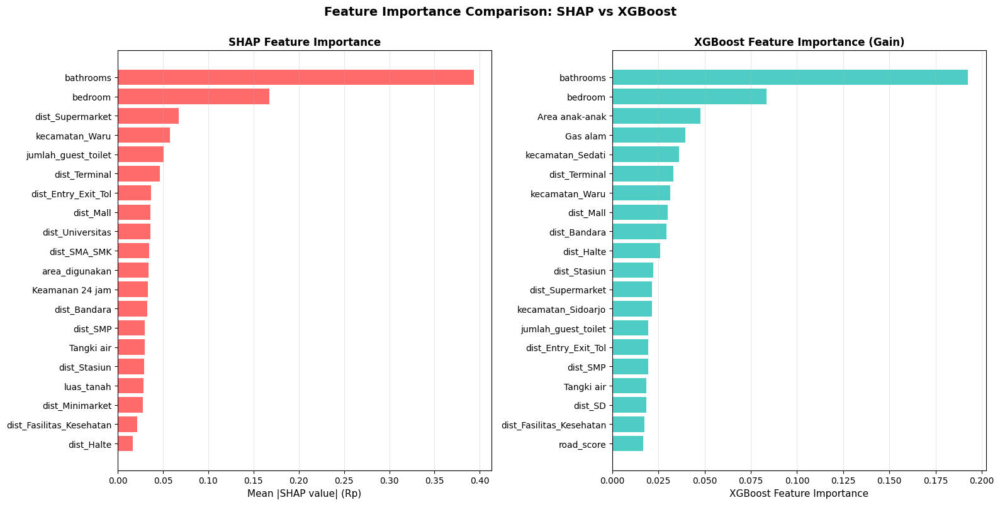

In [25]:
# SHAP Feature Importance Comparison dengan XGBoost Feature Importance
if shap_values_original is not None:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # SHAP Importance
    shap_importance = pd.DataFrame({
        'feature': feature_names,
        'shap_importance': np.abs(shap_values_original).mean(axis=0)
    }).sort_values('shap_importance', ascending=True).tail(20)

    axes[0].barh(range(len(shap_importance)), shap_importance['shap_importance'], color='#FF6B6B')
    axes[0].set_yticks(range(len(shap_importance)))
    axes[0].set_yticklabels(shap_importance['feature'])
    axes[0].set_xlabel('Mean |SHAP value| (Rp)', fontsize=11)
    axes[0].set_title('SHAP Feature Importance', fontsize=12, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

    # XGBoost Importance (Gain)
    xgb_importance = pd.DataFrame({
        'feature': X_train_XB.columns,
        'xgb_importance': best_model.feature_importances_
    }).sort_values('xgb_importance', ascending=True).tail(20)

    axes[1].barh(range(len(xgb_importance)), xgb_importance['xgb_importance'], color='#4ECDC4')
    axes[1].set_yticks(range(len(xgb_importance)))
    axes[1].set_yticklabels(xgb_importance['feature'])
    axes[1].set_xlabel('XGBoost Feature Importance', fontsize=11)
    axes[1].set_title('XGBoost Feature Importance (Gain)', fontsize=12, fontweight='bold')
    axes[1].grid(axis='x', alpha=0.3)

    plt.suptitle('Feature Importance Comparison: SHAP vs XGBoost', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping comparison plot.")


In [26]:
all_shap_importance = pd.DataFrame({
    'feature': feature_names,
    'shap_importance': np.abs(shap_values).mean(axis=0)
}).sort_values('shap_importance', ascending=True)

In [27]:
all_shap_importance.to_csv('/kaggle/working/3_feature_importance_SHAP_final.csv', index=False)

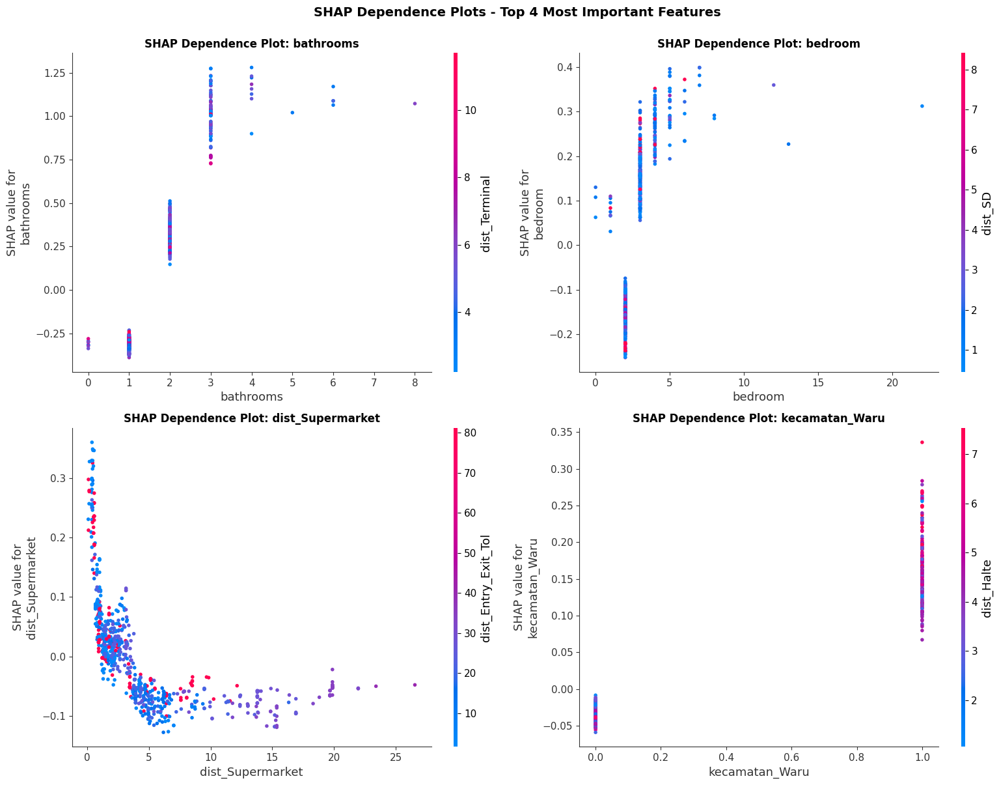

In [28]:
# SHAP Dependence Plot - Top 4 features
if shap_values_original is not None:
    # Get top 4 features by mean absolute SHAP
    shap_importance = pd.DataFrame({
        'feature': feature_names,
        'importance': np.abs(shap_values_original).mean(axis=0)
    }).sort_values('importance', ascending=False)

    top_4_features = shap_importance.head(4)['feature'].tolist()
    top_4_indices = [feature_names.index(f) for f in top_4_features]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for i, (feature, feat_idx) in enumerate(zip(top_4_features, top_4_indices)):
        plt.sca(axes[i])
        shap.dependence_plot(
            feat_idx,
            shap_values_original,
            X_shap_np,
            feature_names=feature_names,
            interaction_index="auto",
            show=False,
            ax=axes[i]
        )
        axes[i].set_title(f'SHAP Dependence Plot: {feature}', fontsize=12, fontweight='bold')

    plt.suptitle('SHAP Dependence Plots - Top 4 Most Important Features', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping dependence plots.")


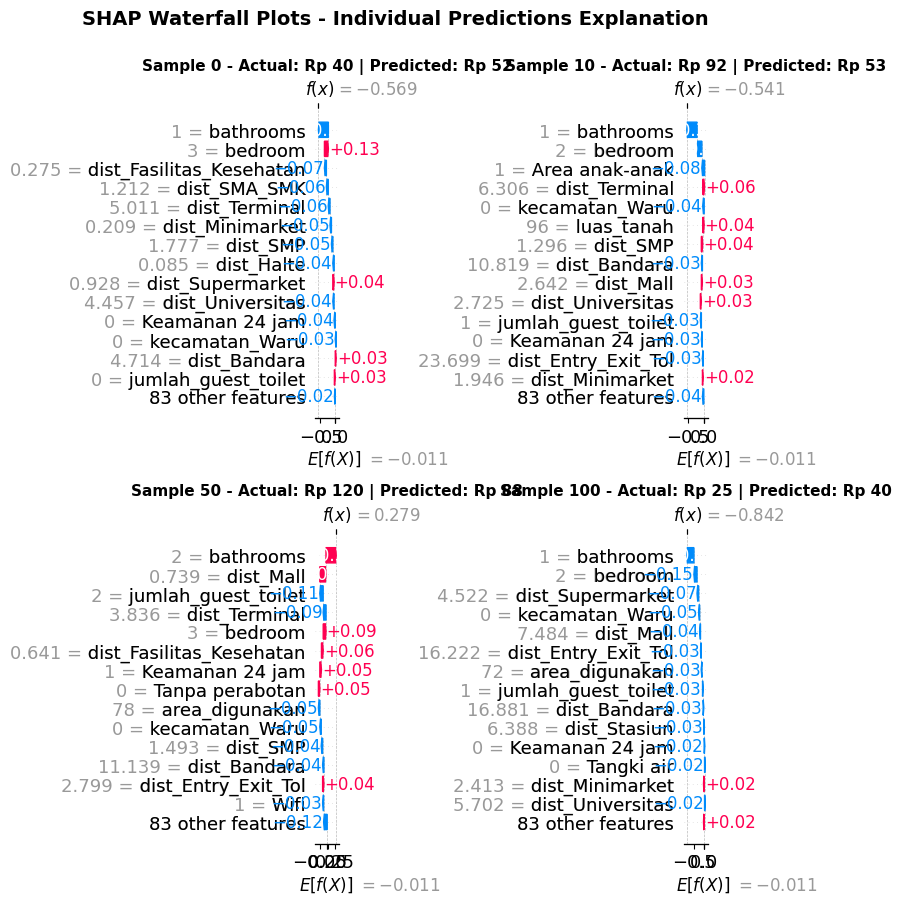

In [29]:
# SHAP Waterfall Plot - Contoh prediksi individual
if shap_values_original is not None and expected_value_original is not None:
    sample_idx = [0, 10, 50, 100]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for i, idx in enumerate(sample_idx):
        if idx < len(X_shap_np):
            plt.sca(axes[i])
            shap.waterfall_plot(
                shap.Explanation(
                    values=shap_values_original[idx],
                    base_values=float(expected_value_original),
                    data=X_shap_np[idx],
                    feature_names=feature_names
                ),
                max_display=15,
                show=False
            )
            
            actual_price = X_shap_target_original[idx]
            predicted_price = train_pred_original[idx]
            axes[i].set_title(f'Sample {idx} - Actual: Rp {actual_price:,.0f} | Predicted: Rp {predicted_price:,.0f}', 
                             fontsize=11, fontweight='bold')

    plt.suptitle('SHAP Waterfall Plots - Individual Predictions Explanation', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping waterfall plots.")


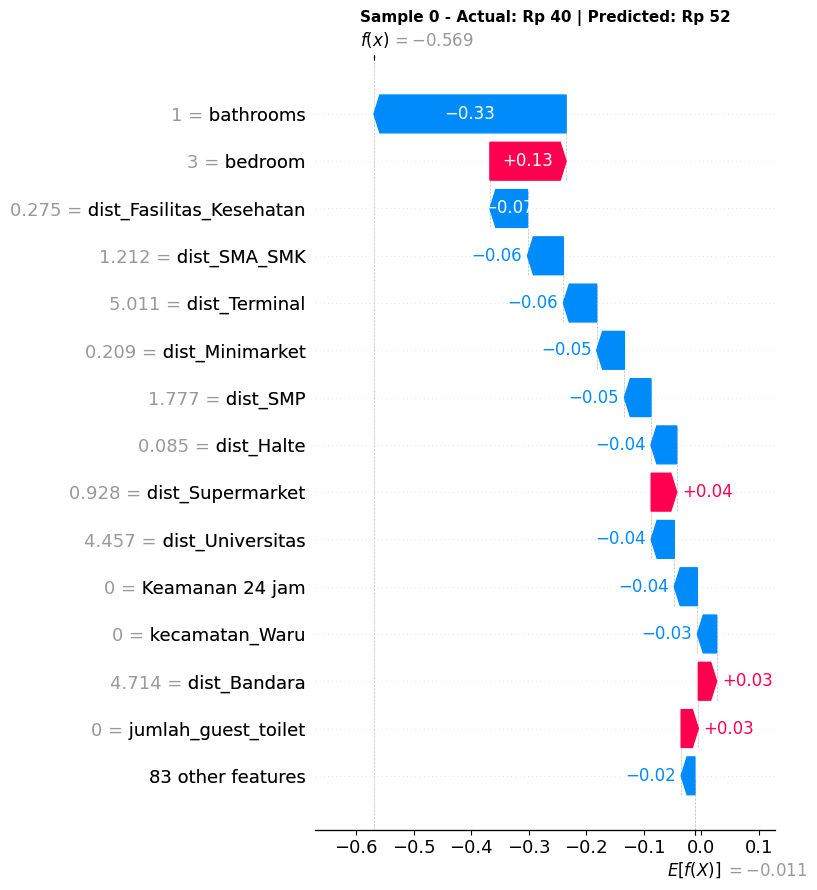

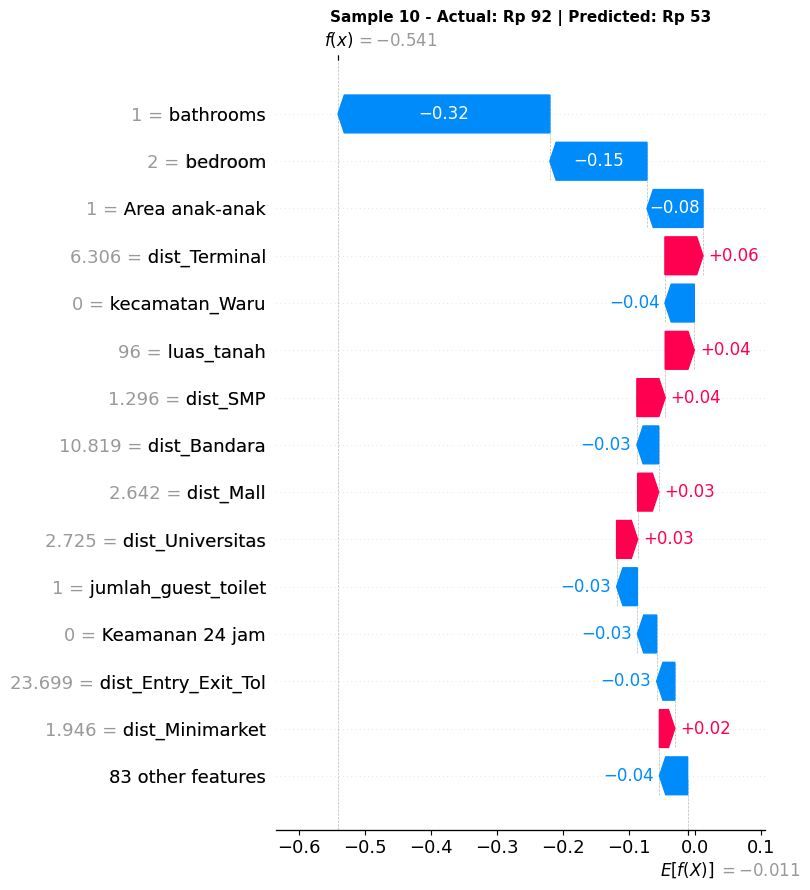

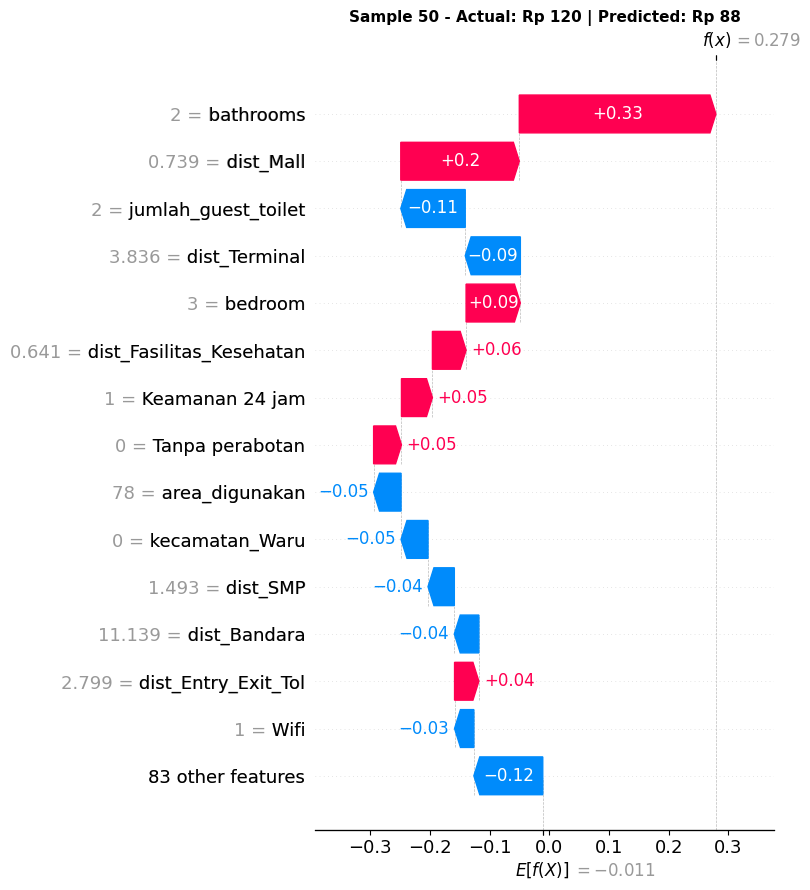

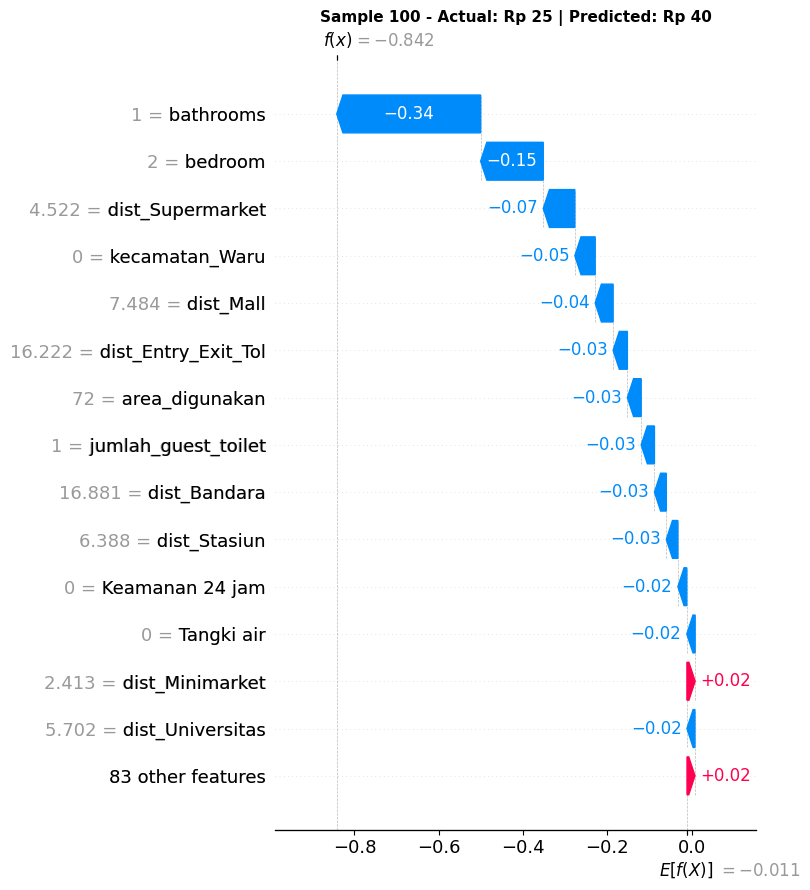

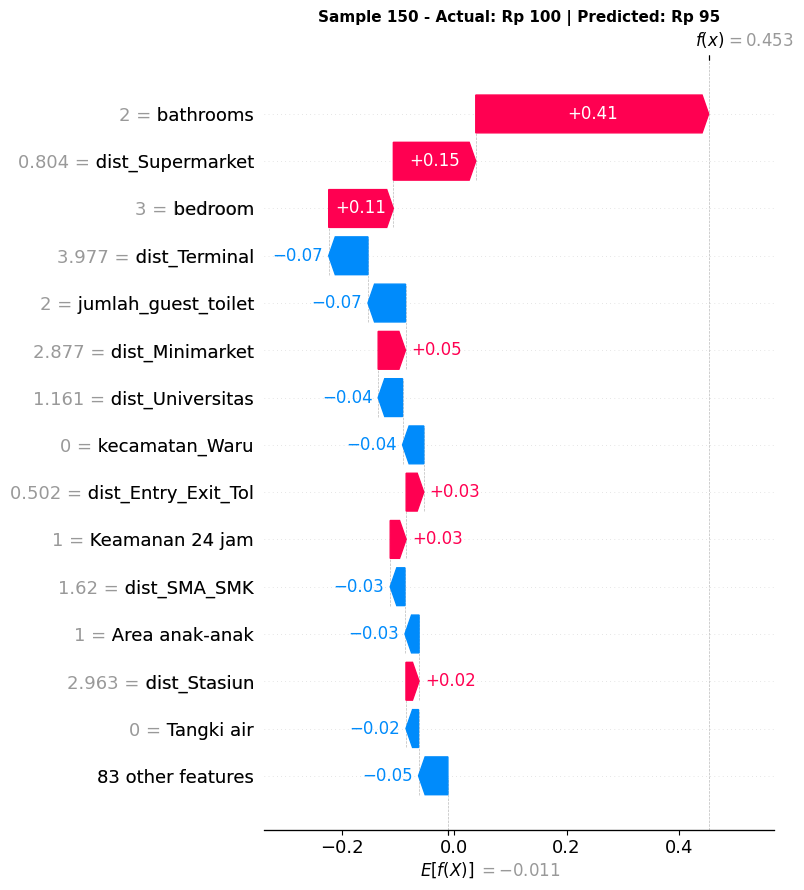

In [30]:
# SHAP Waterfall Plot - Output satu per satu (5 sampel)
if shap_values_original is not None and expected_value_original is not None:
    
    sample_idx = [0, 10, 50, 100, 150]  # 5 contoh
    
    for idx in sample_idx:
        if idx < len(X_shap_np):
            
            plt.figure(figsize=(10, 6))  # Buat figure baru tiap loop
            
            shap.waterfall_plot(
                shap.Explanation(
                    values=shap_values_original[idx],
                    base_values=float(expected_value_original),
                    data=X_shap_np[idx],
                    feature_names=feature_names
                ),
                max_display=15,
                show=False
            )
            
            actual_price = X_shap_target_original[idx]
            predicted_price = train_pred_original[idx]
            
            plt.title(
                f'Sample {idx} - Actual: Rp {actual_price:,.0f} | Predicted: Rp {predicted_price:,.0f}',
                fontsize=11,
                fontweight='bold'
            )
            
            plt.tight_layout()
            plt.show()  # tampilkan satu-satu

else:
    print("⚠ SHAP values not available. Skipping waterfall plots.")

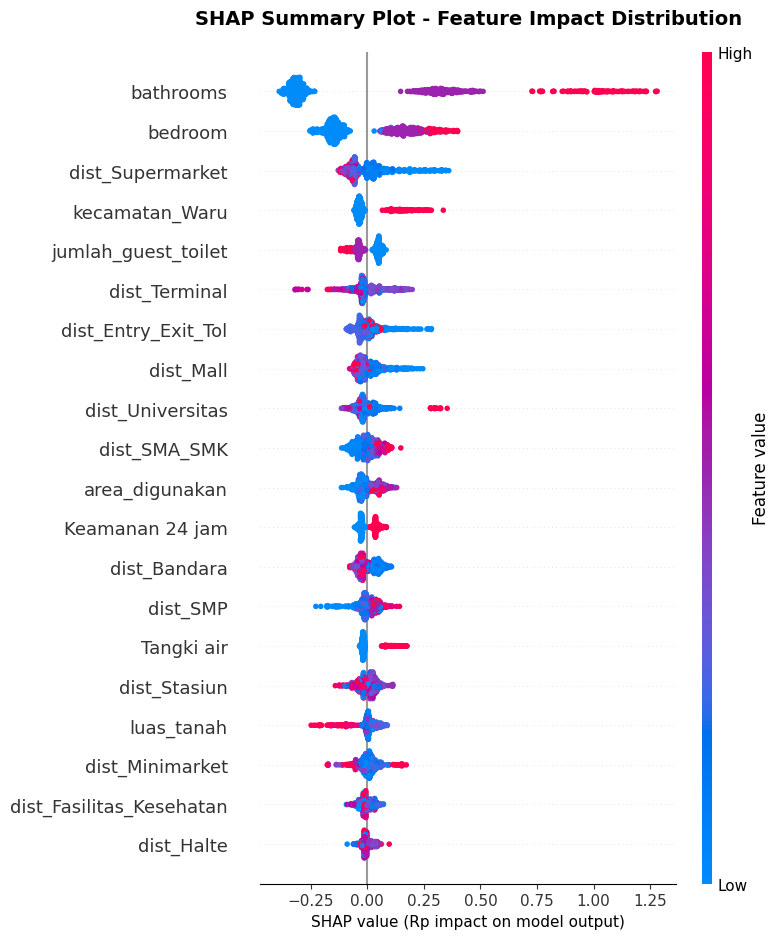

In [31]:
# SHAP Summary Plot - Beeswarm (Feature Impact Distribution)
if shap_values_original is not None:
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values_original, X_shap_np, feature_names=feature_names, max_display=20, show=False)
    plt.title('SHAP Summary Plot - Feature Impact Distribution', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('SHAP value (Rp impact on model output)', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping beeswarm plot.")


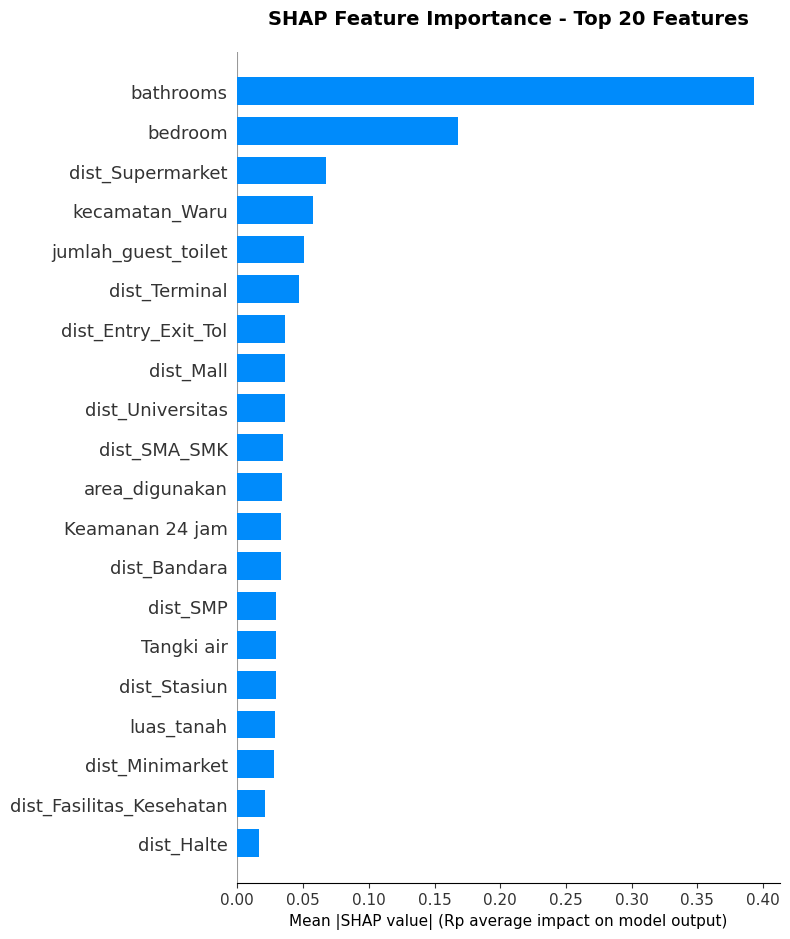

In [32]:
# SHAP Summary Plot - Bar (Feature Importance)
if shap_values_original is not None:
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values_original, X_shap_np, feature_names=feature_names, plot_type="bar", max_display=20, show=False)
    plt.title('SHAP Feature Importance - Top 20 Features', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Mean |SHAP value| (Rp average impact on model output)', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping bar plot.")


## CatBoost

In [33]:
from catboost import CatBoostRegressor

In [34]:
# TARGET & FEATURE untuk CatBoost
y_train_CB = train_df_transformed["Harga_Asli"]
X_train_CB = train_df_transformed.drop(columns=["Harga_Asli", "latitude", "longitude"])

y_test_CB = val_df_transformed["Harga_Asli"]
X_test_CB = val_df_transformed.drop(columns=["Harga_Asli", "latitude", "longitude"])

In [35]:
catboost_model = CatBoostRegressor(
    loss_function='RMSE',
    task_type='CPU',         
    devices='0',              
    gpu_ram_part=0.5,          
    verbose=0,
    random_state=42,
    # GPU-specific optimizations
    max_ctr_complexity=4
)

param_dist_cb = {
    "iterations": randint(300, 800),
    "depth": randint(4, 10),
    "learning_rate": uniform(0.01, 0.2),
    "l2_leaf_reg": uniform(1, 10),
    "border_count": [32, 64, 128, 254],
    "bagging_temperature": uniform(0, 1),
    "random_strength": uniform(0, 2),
    "bootstrap_type": ['MVS']
}

### Cross Validation

In [36]:
import warnings
warnings.filterwarnings('ignore')

cv = KFold(n_splits=5)

random_search_cb = RandomizedSearchCV(
    estimator=catboost_model,
    param_distributions=param_dist_cb,
    n_iter=50,
    scoring="neg_root_mean_squared_error",
    cv=cv,
    verbose=2,
    random_state=42,
    n_jobs=1,
    error_score="raise"
)

random_search_cb.fit(
    X_train_CB,
    y_train_CB
)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END bagging_temperature=0.3745401188473625, bootstrap_type=MVS, border_count=32, depth=6, iterations=371, l2_leaf_reg=6.986584841970366, learning_rate=0.0412037280884873, random_strength=0.3119890406724053; total time=   0.9s
[CV] END bagging_temperature=0.3745401188473625, bootstrap_type=MVS, border_count=32, depth=6, iterations=371, l2_leaf_reg=6.986584841970366, learning_rate=0.0412037280884873, random_strength=0.3119890406724053; total time=   0.8s
[CV] END bagging_temperature=0.3745401188473625, bootstrap_type=MVS, border_count=32, depth=6, iterations=371, l2_leaf_reg=6.986584841970366, learning_rate=0.0412037280884873, random_strength=0.3119890406724053; total time=   0.8s
[CV] END bagging_temperature=0.3745401188473625, bootstrap_type=MVS, border_count=32, depth=6, iterations=371, l2_leaf_reg=6.986584841970366, learning_rate=0.0412037280884873, random_strength=0.3119890406724053; total time=   0.8s
[CV] END baggi

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='raise',
                   estimator=CatBoostRegressor(devices='0', gpu_ram_part=0.5, loss_function='RMSE', max_ctr_complexity=4, random_state=42, task_type='CPU', verbose=0),
                   n_iter=50, n_jobs=1,
                   param_distributions={'bagging_temperature': <scipy.stats._distn_infrastructure.rv_continuous_froze...
                                        'l2_leaf_reg': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x783805b7f590>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x783805a8e900>,
                                        'random_strength': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7838066f9580>},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=2)

In [37]:
best_model = random_search_cb.best_estimator_
best_model_cb = best_model

print("Best Params:")
print(random_search_cb.best_params_)

Best Params:
{'bagging_temperature': np.float64(0.9422017556848528), 'bootstrap_type': 'MVS', 'border_count': 64, 'depth': 5, 'iterations': 564, 'l2_leaf_reg': np.float64(1.159662522202142), 'learning_rate': np.float64(0.056178765124429805), 'random_strength': np.float64(0.48205093205202343)}


# IFS FI CatBoost

Jumlah variabel tetap (Kecamatan): 18
Jumlah variabel kandidat (Akan diseleksi): 79

1. Sedang merangking fitur kandidat menggunakan Feature Importance (CatBoost)...
   ✓ Ranking Selesai! Fitur kandidat teratas: bathrooms

2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...
Baseline | Total fitur: 18 | MAE Train: Rp 26.71 | MAE Test: Rp 30.13
Iterasi 1/79 | Total fitur: 19 | MAE Train: Rp 18.96 | MAE Test: Rp 20.59
Iterasi 2/79 | Total fitur: 20 | MAE Train: Rp 17.05 | MAE Test: Rp 20.93
Iterasi 3/79 | Total fitur: 21 | MAE Train: Rp 13.46 | MAE Test: Rp 19.09
Iterasi 4/79 | Total fitur: 22 | MAE Train: Rp 12.55 | MAE Test: Rp 18.72
Iterasi 5/79 | Total fitur: 23 | MAE Train: Rp 12.35 | MAE Test: Rp 18.97
Iterasi 6/79 | Total fitur: 24 | MAE Train: Rp 11.11 | MAE Test: Rp 19.23
Iterasi 7/79 | Total fitur: 25 | MAE Train: Rp 10.66 | MAE Test: Rp 19.27
Iterasi 8/79 | Total fitur: 26 | MAE Train: Rp 10.67 | MAE Test: Rp 19.14
Iterasi 9/79 | Total fitur: 27 | MAE Train: Rp 10.38

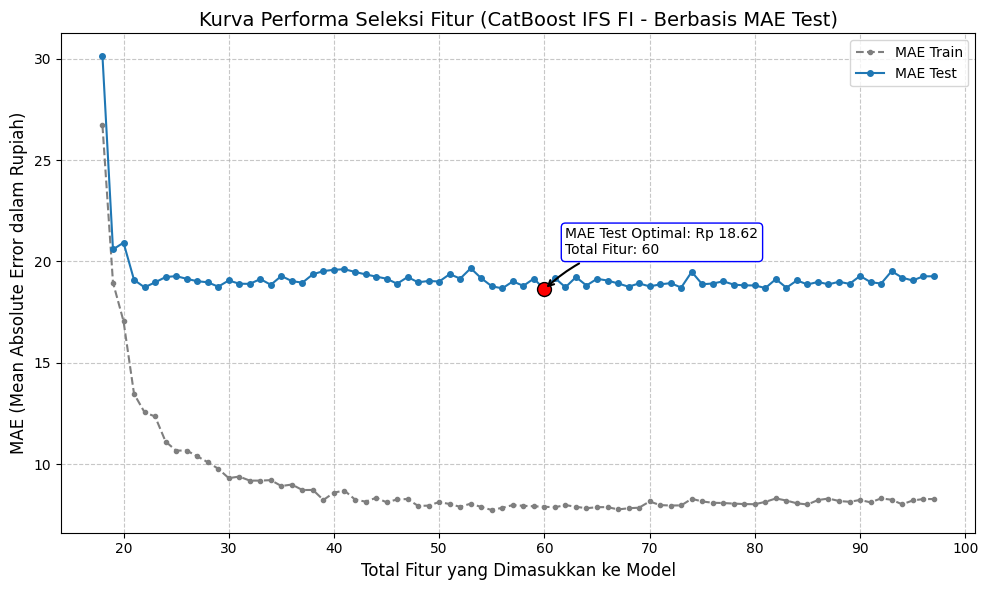


3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...

## Hasil Evaluasi Final CatBoost IFS FI ##
Train MAE: Rp 7.89
Train RMSE: Rp 15.90
Train R²: 0.8599
Test MAE: Rp 18.62
Test RMSE: Rp 27.55
Test R²: 0.6600


,Harga Aktual,Harga Prediksi,Selisih (Absolut)
0,Rp 49.48,Rp 44.37,Rp 5.11
1,Rp 48.00,Rp 42.95,Rp 5.05
2,Rp 39.00,Rp 53.29,Rp 14.29
3,Rp 50.00,Rp 44.52,Rp 5.48
4,Rp 141.00,Rp 96.59,Rp 44.41
5,Rp 150.00,Rp 35.25,Rp 114.75
6,Rp 15.00,Rp 37.24,Rp 22.24
7,Rp 190.00,Rp 96.13,Rp 93.87
8,Rp 40.00,Rp 45.92,Rp 5.92
9,Rp 58.50,Rp 49.79,Rp 8.71


In [38]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold, RandomizedSearchCV
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
import joblib

variabel_tetap = [col for col in X_train_CB.columns if col.startswith('kecamatan_')]
variabel_kandidat = [col for col in X_train_CB.columns if col not in variabel_tetap]

print(f"Jumlah variabel tetap (Kecamatan): {len(variabel_tetap)}")
print(f"Jumlah variabel kandidat (Akan diseleksi): {len(variabel_kandidat)}")
print("\n1. Sedang merangking fitur kandidat menggunakan Feature Importance (CatBoost)...")

rank_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)
rank_model.fit(X_train_CB, y_train_CB)
feat_imp_dict = dict(zip(X_train_CB.columns, rank_model.feature_importances_))
candidate_imp = {feat: feat_imp_dict[feat] for feat in variabel_kandidat}
ranked_candidates = sorted(candidate_imp.items(), key=lambda x: x[1], reverse=True)
ranked_candidates_list = [f[0] for f in ranked_candidates]
print(f"   ✓ Ranking Selesai! Fitur kandidat teratas: {ranked_candidates_list[0]}")

price_transformer = fitted_transformers['harga_asli']

def inverse_transform_target(values):
    if hasattr(values, 'values'):
        values = values.values
    return price_transformer.inverse_transform(np.asarray(values).reshape(-1, 1)).flatten()

def hitung_mae_asli(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    return mean_absolute_error(y_true_orig, y_pred_orig)

def hitung_metrik_regresi(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    mae = mean_absolute_error(y_true_orig, y_pred_orig)
    rmse = np.sqrt(mean_squared_error(y_true_orig, y_pred_orig))
    r2 = r2_score(y_true_orig, y_pred_orig)
    return mae, rmse, r2, y_true_orig, y_pred_orig

print("\n2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...")
train_mae_scores = []
mae_scores = []
jumlah_fitur_berjalan = []

eval_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)

current_features = variabel_tetap.copy()
eval_model.fit(X_train_CB[current_features], y_train_CB)
train_pred = eval_model.predict(X_train_CB[current_features])
test_pred = eval_model.predict(X_test_CB[current_features])
baseline_train_mae = hitung_mae_asli(y_train_CB, train_pred)
baseline_test_mae = hitung_mae_asli(y_test_CB, test_pred)

train_mae_scores.append(baseline_train_mae)
mae_scores.append(baseline_test_mae)
jumlah_fitur_berjalan.append(len(current_features))
print(f"Baseline | Total fitur: {len(current_features)} | MAE Train: Rp {baseline_train_mae:,.2f} | MAE Test: Rp {baseline_test_mae:,.2f}")

total_candidates = len(ranked_candidates_list)
for i in range(1, total_candidates + 1):
    current_features = variabel_tetap + ranked_candidates_list[:i]
    eval_model.fit(X_train_CB[current_features], y_train_CB)
    train_pred = eval_model.predict(X_train_CB[current_features])
    test_pred = eval_model.predict(X_test_CB[current_features])
    train_mae = hitung_mae_asli(y_train_CB, train_pred)
    test_mae = hitung_mae_asli(y_test_CB, test_pred)
    train_mae_scores.append(train_mae)
    mae_scores.append(test_mae)
    jumlah_fitur_berjalan.append(len(current_features))
    print(f"Iterasi {i}/{total_candidates} | Total fitur: {len(current_features)} | MAE Train: Rp {train_mae:,.2f} | MAE Test: Rp {test_mae:,.2f}")

min_mae = min(mae_scores)
best_index = mae_scores.index(min_mae)
best_total_num = jumlah_fitur_berjalan[best_index]
best_added_num = best_total_num - len(variabel_tetap)
best_features_final_cb = variabel_tetap + ranked_candidates_list[:best_added_num]

print(f"\n✅ SELESAI! Titik optimal ditemukan pada penggunaan total {best_total_num} fitur.")
print(f"(Rincian: {len(variabel_tetap)} Variabel Tetap + {best_added_num} Variabel Kandidat)")
print(f"Nilai MAE Test Terendah: Rp {min_mae:,.2f}")

plt.figure(figsize=(10, 6))
plt.plot(jumlah_fitur_berjalan, train_mae_scores, marker='.', linestyle='--', color='#7f7f7f', markersize=6, label='MAE Train')
plt.plot(jumlah_fitur_berjalan, mae_scores, marker='.', linestyle='-', color='#1f77b4', markersize=8, label='MAE Test')
plt.plot(best_total_num, min_mae, 'ro', markersize=10, markeredgecolor='black')

y_offset = (max(mae_scores) - min(mae_scores)) * 0.15
if y_offset == 0:
    y_offset = max(min_mae * 0.05, 1)

plt.annotate(
    f'MAE Test Optimal: Rp {min_mae:,.2f}\nTotal Fitur: {best_total_num}',
    xy=(best_total_num, min_mae),
    xytext=(best_total_num + 2, min_mae + y_offset),
    bbox=dict(boxstyle="round,pad=0.3", edgecolor='blue', facecolor='white'),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", color='black', lw=1.5)
 )

plt.title('Kurva Performa Seleksi Fitur (CatBoost IFS FI - Berbasis MAE Test)', fontsize=14)
plt.xlabel('Total Fitur yang Dimasukkan ke Model', fontsize=12)
plt.ylabel('MAE (Mean Absolute Error dalam Rupiah)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

X_train_optimal = X_train_CB[best_features_final_cb]
X_test_optimal = X_test_CB[best_features_final_cb]

print("\n3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...")
eval_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)
eval_model.fit(X_train_optimal, y_train_CB)
y_pred_train_transformed = eval_model.predict(X_train_optimal)
y_pred_test_transformed = eval_model.predict(X_test_optimal)

train_mae, train_rmse, train_r2, y_train_original, y_pred_train_original = hitung_metrik_regresi(y_train_CB, y_pred_train_transformed)
test_mae, test_rmse, test_r2, y_test_original, y_pred_test_original = hitung_metrik_regresi(y_test_CB, y_pred_test_transformed)

print("\n## Hasil Evaluasi Final CatBoost IFS FI ##")
print(f"Train MAE: Rp {train_mae:,.2f}")
print(f"Train RMSE: Rp {train_rmse:,.2f}")
print(f"Train R²: {train_r2:.4f}")
print(f"Test MAE: Rp {test_mae:,.2f}")
print(f"Test RMSE: Rp {test_rmse:,.2f}")
print(f"Test R²: {test_r2:.4f}")

comparison_df = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': y_pred_test_original,
    'Selisih (Absolut)': np.abs(y_test_original - y_pred_test_original)
})

pd.options.display.float_format = 'Rp {:,.2f}'.format
display(comparison_df.head(10))

In [39]:
x_cb_fi = jumlah_fitur_berjalan.copy()
y_cb_fi = mae_scores.copy()

# Simpan hasil IFS FI CatBoost agar tidak tertimpa oleh proses berikutnya
best_features_final_cb_fi = best_features_final_cb.copy()

from pathlib import Path
output_dir = Path('output_data')
output_dir.mkdir(parents=True, exist_ok=True)

pd.DataFrame({
    'n_features': x_cb_fi,
    'mae_test': y_cb_fi
}).to_csv(output_dir / 'ifs_curve_cb_fi.csv', index=False)

pd.DataFrame({
    'selected_feature': best_features_final_cb_fi
}).to_csv(output_dir / 'selected_features_cb_fi.csv', index=False)

print('Tersimpan: ifs_curve_cb_fi.csv dan selected_features_cb_fi.csv')

Tersimpan: ifs_curve_cb_fi.csv dan selected_features_cb_fi.csv


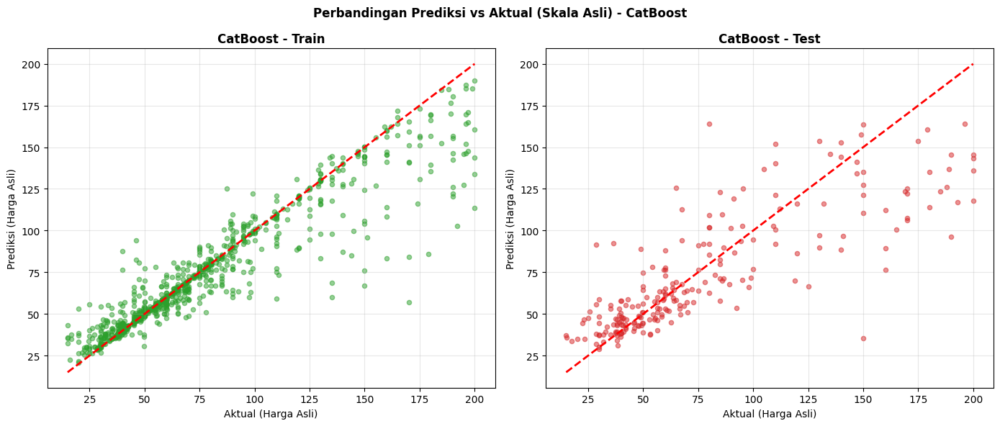

In [40]:
# Perbandingan Prediksi vs Aktual (Skala Asli) - CatBoost
import matplotlib.pyplot as plt

# Fallback nama variabel agar kompatibel dengan sel evaluasi IFS
if 'y_train_cb_orig' in globals():
    y_train_plot = globals()['y_train_cb_orig']
elif 'y_train_original' in globals():
    y_train_plot = globals()['y_train_original']
else:
    raise NameError("Variabel train aktual CatBoost tidak ditemukan")

if 'y_pred_train_cb_orig' in globals():
    y_pred_train_plot = globals()['y_pred_train_cb_orig']
elif 'y_pred_train_original' in globals():
    y_pred_train_plot = globals()['y_pred_train_original']
else:
    raise NameError("Variabel train prediksi CatBoost tidak ditemukan")

if 'y_test_cb_orig' in globals():
    y_test_plot = globals()['y_test_cb_orig']
elif 'y_test_original' in globals():
    y_test_plot = globals()['y_test_original']
else:
    raise NameError("Variabel test aktual CatBoost tidak ditemukan")

if 'y_pred_test_cb_orig' in globals():
    y_pred_test_plot = globals()['y_pred_test_cb_orig']
elif 'y_pred_test_original' in globals():
    y_pred_test_plot = globals()['y_pred_test_original']
else:
    raise NameError("Variabel test prediksi CatBoost tidak ditemukan")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Train plot
axes[0].scatter(y_train_plot, y_pred_train_plot, alpha=0.5, s=20, color='#2ca02c')
min_train = min(y_train_plot.min(), y_pred_train_plot.min())
max_train = max(y_train_plot.max(), y_pred_train_plot.max())
axes[0].plot([min_train, max_train], [min_train, max_train], 'r--', linewidth=2)
axes[0].set_title('CatBoost - Train', fontweight='bold')
axes[0].set_xlabel('Aktual (Harga Asli)')
axes[0].set_ylabel('Prediksi (Harga Asli)')
axes[0].grid(alpha=0.3)

# Test plot
axes[1].scatter(y_test_plot, y_pred_test_plot, alpha=0.5, s=20, color='#d62728')
min_test = min(y_test_plot.min(), y_pred_test_plot.min())
max_test = max(y_test_plot.max(), y_pred_test_plot.max())
axes[1].plot([min_test, max_test], [min_test, max_test], 'r--', linewidth=2)
axes[1].set_title('CatBoost - Test', fontweight='bold')
axes[1].set_xlabel('Aktual (Harga Asli)')
axes[1].set_ylabel('Prediksi (Harga Asli)')
axes[1].grid(alpha=0.3)

plt.suptitle('Perbandingan Prediksi vs Aktual (Skala Asli) - CatBoost', fontweight='bold')
plt.tight_layout()
plt.show()

In [41]:
importance = pd.DataFrame({
    "feature": X_train_CB.columns,
    "importance": best_model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance.head(20))

                     feature  importance
1                  bathrooms    Rp 20.42
0                    bedroom    Rp 11.56
15             dist_Terminal     Rp 5.72
5                 luas_tanah     Rp 4.17
11                 dist_Mall     Rp 3.73
12          dist_Supermarket     Rp 3.60
16              dist_Bandara     Rp 3.45
4             area_digunakan     Rp 3.44
95            kecamatan_Waru     Rp 3.22
10  dist_Fasilitas_Kesehatan     Rp 3.15
9           dist_Universitas     Rp 2.86
13           dist_Minimarket     Rp 2.73
17                dist_Halte     Rp 2.61
18       dist_Entry_Exit_Tol     Rp 2.37
2        jumlah_guest_toilet     Rp 2.28
7                   dist_SMP     Rp 2.00
14              dist_Stasiun     Rp 1.88
6                    dist_SD     Rp 1.47
8               dist_SMA_SMK     Rp 1.46
65           Keamanan 24 jam     Rp 1.36


In [42]:
importance.to_csv('/kaggle/working/4_feature_importance_Catboost.csv', index=False)

CATBOOST FEATURE IMPORTANCE ANALYSIS


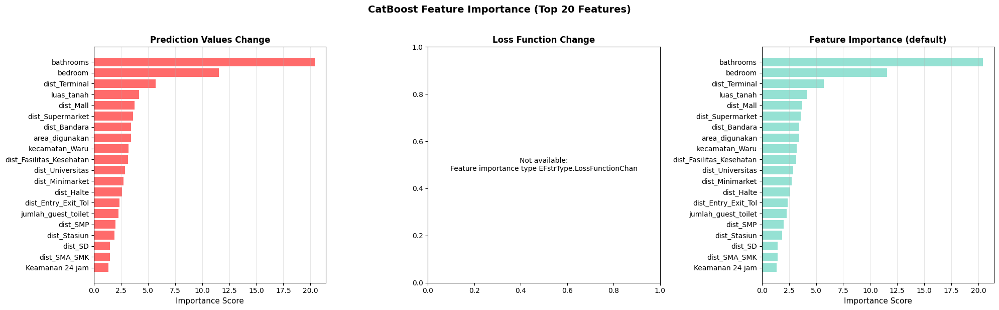


DETAILED FEATURE IMPORTANCE COMPARISON

Top 20 Most Important Features:
                 feature  importance_default  importance_pvc
               bathrooms            Rp 20.42        Rp 20.42
                 bedroom            Rp 11.56        Rp 11.56
           dist_Terminal             Rp 5.72         Rp 5.72
              luas_tanah             Rp 4.17         Rp 4.17
               dist_Mall             Rp 3.73         Rp 3.73
        dist_Supermarket             Rp 3.60         Rp 3.60
            dist_Bandara             Rp 3.45         Rp 3.45
          area_digunakan             Rp 3.44         Rp 3.44
          kecamatan_Waru             Rp 3.22         Rp 3.22
dist_Fasilitas_Kesehatan             Rp 3.15         Rp 3.15
        dist_Universitas             Rp 2.86         Rp 2.86
         dist_Minimarket             Rp 2.73         Rp 2.73
              dist_Halte             Rp 2.61         Rp 2.61
     dist_Entry_Exit_Tol             Rp 2.37         Rp 2.37
     jumlah_

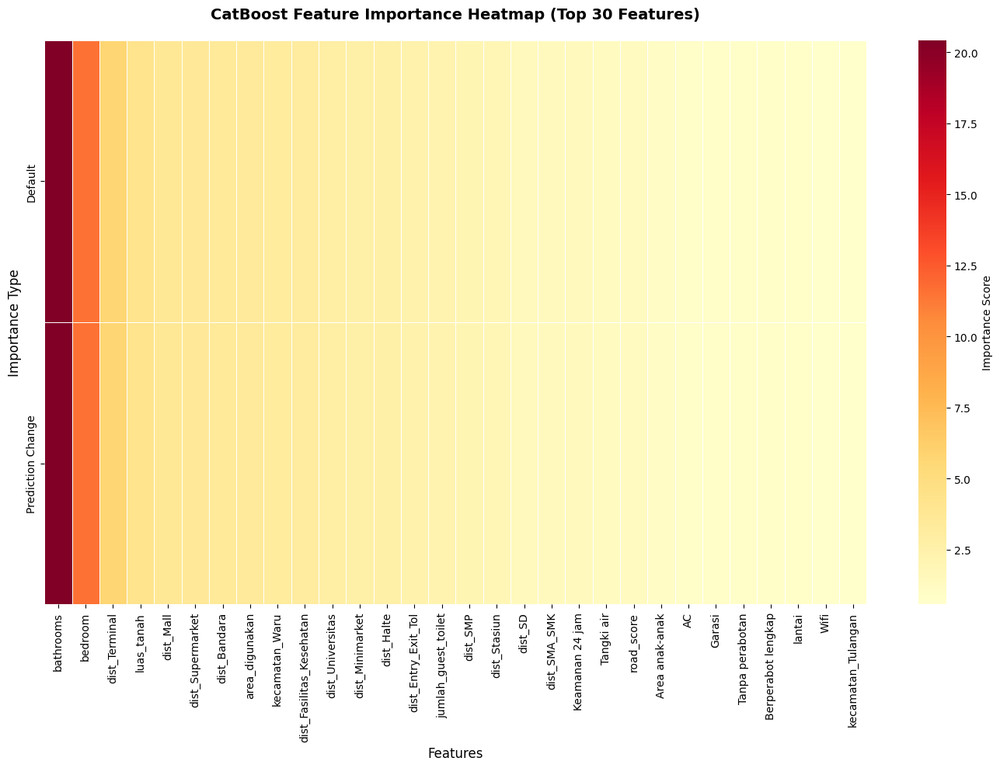

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================================
# CATBOOST FEATURE IMPORTANCE
# ============================================================================

# Method 1: Menggunakan get_feature_importance() - Native CatBoost
print("="*80)
print("CATBOOST FEATURE IMPORTANCE ANALYSIS")
print("="*80)

# Dapatkan feature importance dengan berbagai tipe
importance_types = {
    'PredictionValuesChange': 'Prediction Values Change',
    'LossFunctionChange': 'Loss Function Change', 
    'FeatureImportance': 'Feature Importance (default)'
}

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for idx, (imp_type, title) in enumerate(importance_types.items()):
    try:
        # Get importance scores
        importance_scores = best_model.get_feature_importance(
            type=imp_type,
            prettified=False
        )
        
        # Create DataFrame
        importance_df = pd.DataFrame({
            'feature': X_train_CB.columns,
            'importance': importance_scores
        }).sort_values('importance', ascending=True).tail(20)
        
        # Plot
        axes[idx].barh(range(len(importance_df)), importance_df['importance'], color=['#FF6B6B', '#4ECDC4', '#95E1D3'][idx])
        axes[idx].set_yticks(range(len(importance_df)))
        axes[idx].set_yticklabels(importance_df['feature'])
        axes[idx].set_xlabel('Importance Score', fontsize=11)
        axes[idx].set_title(title, fontsize=12, fontweight='bold')
        axes[idx].grid(axis='x', alpha=0.3)
        
    except Exception as e:
        axes[idx].text(0.5, 0.5, f'Not available:\n{str(e)[:50]}', 
                      ha='center', va='center', transform=axes[idx].transAxes)
        axes[idx].set_title(title, fontsize=12, fontweight='bold')

plt.suptitle('CatBoost Feature Importance (Top 20 Features)', 
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Method 2: Detailed DataFrame Analysis
print("\n" + "="*80)
print("DETAILED FEATURE IMPORTANCE COMPARISON")
print("="*80)

importance_comparison = pd.DataFrame({
    'feature': X_train_CB.columns,
    'importance_default': best_model.get_feature_importance(prettified=False)
})

# Tambahkan tipe lain jika tersedia
try:
    importance_comparison['importance_pvc'] = best_model.get_feature_importance(
        type='PredictionValuesChange', prettified=False
    )
except:
    pass

try:
    importance_comparison['importance_lfc'] = best_model.get_feature_importance(
        type='LossFunctionChange', prettified=False
    )
except:
    pass

# Sort by default importance
importance_comparison = importance_comparison.sort_values('importance_default', ascending=False)

print("\nTop 20 Most Important Features:")
print(importance_comparison.head(20).to_string(index=False))

# Method 3: Heatmap untuk perbandingan
plt.figure(figsize=(14, 10))

# Ambil top 30 features
top_30 = importance_comparison.head(30).copy()

# Pilih kolom numerik saja
numeric_cols = [col for col in top_30.columns if col.startswith('importance_')]
heatmap_data = top_30[numeric_cols].T

# Rename untuk label lebih baik
rename_map = {
    'importance_default': 'Default',
    'importance_pvc': 'Prediction Change',
    'importance_lfc': 'Loss Change'
}
heatmap_data.index = [rename_map.get(idx, idx) for idx in heatmap_data.index]

sns.heatmap(
    heatmap_data,
    xticklabels=top_30['feature'].values,
    yticklabels=heatmap_data.index,
    cmap='YlOrRd',
    annot=False,
    cbar_kws={'label': 'Importance Score'},
    linewidths=0.5
)

plt.title('CatBoost Feature Importance Heatmap (Top 30 Features)', 
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Importance Type', fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# IFS SHAP CatBoost

In [44]:
# SHAP Analysis untuk CatBoost
# CatBoost memiliki native support yang lebih baik untuk SHAP!

import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("SHAP ANALYSIS - CATBOOST MODEL")
print("="*80)

# Step 1: Ambil sample data untuk efisiensi komputasi
print("\n[1/4] Preparing data for SHAP analysis...")

n_samples = min(1000, len(X_train_CB))
sample_indices = X_train_CB.sample(n_samples, random_state=42).index
X_shap_sample = X_train_CB.loc[sample_indices].copy()
y_shap_sample = y_train_CB.loc[sample_indices].copy()

# Simpan nama kolom
feature_names_cb = X_shap_sample.columns.tolist()

print(f"   Sample size: {X_shap_sample.shape}")
print(f"   Features: {len(feature_names_cb)}")

# Step 2: Create SHAP explainer - SANGAT MUDAH dengan CatBoost!
print("\n[2/4] Creating SHAP TreeExplainer for CatBoost...")
shap_success = False
shap_values_cb = None
explainer_cb = None
expected_value_cb = None

try:
    # CatBoost native support - langsung gunakan model yang sudah di-train!
    explainer_cb = shap.TreeExplainer(best_model)
    expected_value_cb = explainer_cb.expected_value
    print("   ✓ TreeExplainer created successfully")
    print(f"   ✓ Base value: Rp {float(expected_value_cb):,.0f}")
    shap_success = True
except Exception as e:
    print(f"   ✗ TreeExplainer failed: {str(e)}")
    shap_success = False

# Step 3: Calculate SHAP values
if shap_success and explainer_cb is not None:
    print("\n[3/4] Calculating SHAP values...")
    try:
        shap_values_cb = explainer_cb.shap_values(X_shap_sample)
        
        print(f"   ✓ SHAP values calculated!")
        print(f"   Shape: {shap_values_cb.shape}")
        
        # Step 4: Verify with predictions
        print("\n[4/4] Verifying model performance on sample...")
        train_pred_cb = best_model.predict(X_shap_sample)
        train_rmse = np.sqrt(mean_squared_error(y_shap_sample, train_pred_cb))
        train_mae = mean_absolute_error(y_shap_sample, train_pred_cb)
        print(f"   RMSE: Rp {train_rmse:,.0f}")
        print(f"   MAE: Rp {train_mae:,.0f}")
        
        print("\n" + "="*80)
        print("✓ CATBOOST SHAP ANALYSIS COMPLETED SUCCESSFULLY!")
        print("="*80)
        
    except Exception as e:
        print(f"\n   ✗ Failed to calculate SHAP values: {e}")
        shap_success = False
        shap_values_cb = None
else:
    print("\n" + "="*80)
    print("✗ SHAP ANALYSIS FAILED")
    print("="*80)
    shap_values_cb = None
    train_pred_cb = None

# Alias agar sel visualisasi berikutnya tetap kompatibel
shap_values_cb_original = shap_values_cb if 'shap_values_cb' in locals() else None
expected_value_cb_original = expected_value_cb if 'expected_value_cb' in locals() else None
train_pred_cb_original = inverse_transform_target(train_pred_cb) if 'train_pred_cb' in locals() and train_pred_cb is not None else None
y_shap_sample_original = inverse_transform_target(y_shap_sample) if 'y_shap_sample' in locals() else None

SHAP ANALYSIS - CATBOOST MODEL

[1/4] Preparing data for SHAP analysis...
   Sample size: (916, 97)
   Features: 97

[2/4] Creating SHAP TreeExplainer for CatBoost...
   ✓ TreeExplainer created successfully
   ✓ Base value: Rp -0

[3/4] Calculating SHAP values...
   ✓ SHAP values calculated!
   Shape: (916, 97)

[4/4] Verifying model performance on sample...
   RMSE: Rp 0
   MAE: Rp 0

✓ CATBOOST SHAP ANALYSIS COMPLETED SUCCESSFULLY!


Jumlah variabel tetap (Kecamatan): 18
Jumlah variabel kandidat (Akan diseleksi): 79

1. Sedang merangking fitur kandidat menggunakan SHAP Value...
   Menghitung SHAP values pada 916 sampel data...
   ✓ SHAP Ranking Selesai! Fitur kandidat teratas: bathrooms

2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...
Baseline | Total fitur: 18 | MAE Train: Rp 26.71 | MAE Test: Rp 30.13
Iterasi 1/79 | Total fitur: 19 | MAE Train: Rp 18.96 | MAE Test: Rp 20.59
Iterasi 2/79 | Total fitur: 20 | MAE Train: Rp 17.05 | MAE Test: Rp 20.93
Iterasi 3/79 | Total fitur: 21 | MAE Train: Rp 13.46 | MAE Test: Rp 19.09
Iterasi 4/79 | Total fitur: 22 | MAE Train: Rp 12.79 | MAE Test: Rp 19.37
Iterasi 5/79 | Total fitur: 23 | MAE Train: Rp 11.92 | MAE Test: Rp 19.45
Iterasi 6/79 | Total fitur: 24 | MAE Train: Rp 11.73 | MAE Test: Rp 18.91
Iterasi 7/79 | Total fitur: 25 | MAE Train: Rp 11.37 | MAE Test: Rp 19.00
Iterasi 8/79 | Total fitur: 26 | MAE Train: Rp 10.99 | MAE Test: Rp 18.92
Iterasi 9/79 | T

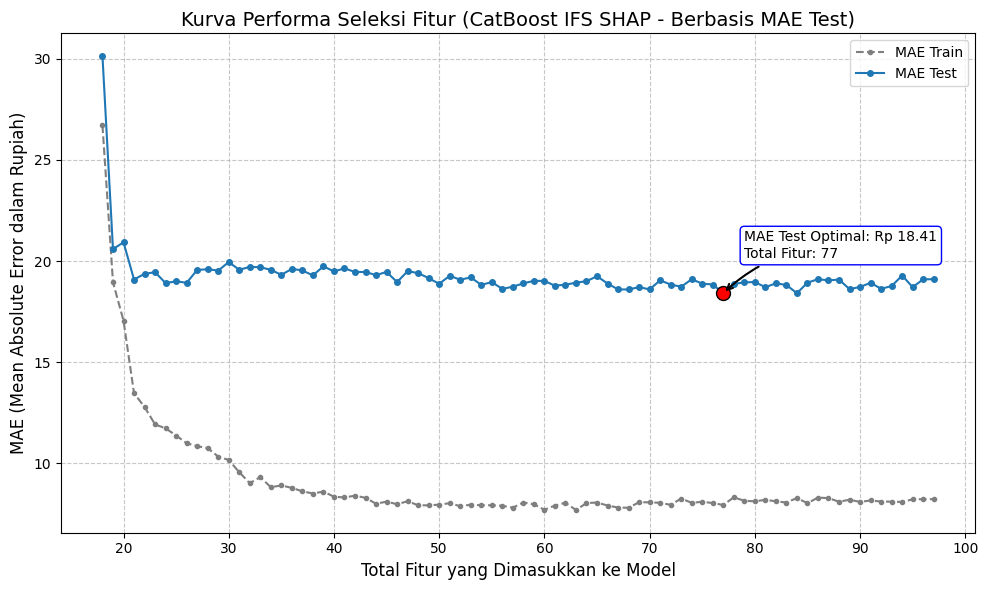


3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...

## Hasil Evaluasi Final CatBoost IFS SHAP ##
Train MAE: Rp 7.94
Train RMSE: Rp 15.91
Train R²: 0.8597
Test MAE: Rp 18.41
Test RMSE: Rp 27.28
Test R²: 0.6666


,Harga Aktual,Harga Prediksi,Selisih (Absolut)
0,Rp 49.48,Rp 40.82,Rp 8.66
1,Rp 48.00,Rp 42.37,Rp 5.63
2,Rp 39.00,Rp 56.69,Rp 17.69
3,Rp 50.00,Rp 43.08,Rp 6.92
4,Rp 141.00,Rp 94.98,Rp 46.02
5,Rp 150.00,Rp 41.20,Rp 108.80
6,Rp 15.00,Rp 36.49,Rp 21.49
7,Rp 190.00,Rp 95.41,Rp 94.59
8,Rp 40.00,Rp 46.85,Rp 6.85
9,Rp 58.50,Rp 45.43,Rp 13.07


In [45]:
import shap
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold, RandomizedSearchCV
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
import joblib

variabel_tetap = [col for col in X_train_CB.columns if col.startswith('kecamatan_')]
variabel_kandidat = [col for col in X_train_CB.columns if col not in variabel_tetap]

print(f"Jumlah variabel tetap (Kecamatan): {len(variabel_tetap)}")
print(f"Jumlah variabel kandidat (Akan diseleksi): {len(variabel_kandidat)}")
print("\n1. Sedang merangking fitur kandidat menggunakan SHAP Value...")

rank_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)
rank_model.fit(X_train_CB, y_train_CB)
n_samples = min(1000, len(X_train_CB))
X_shap_sample = X_train_CB.sample(n_samples, random_state=42)
print(f"   Menghitung SHAP values pada {n_samples} sampel data...")
explainer = shap.TreeExplainer(rank_model)
shap_values = explainer.shap_values(X_shap_sample)
mean_abs_shap = np.abs(shap_values).mean(axis=0)
feat_imp_dict = dict(zip(X_train_CB.columns, mean_abs_shap))
candidate_imp = {feat: feat_imp_dict[feat] for feat in variabel_kandidat}
ranked_candidates = sorted(candidate_imp.items(), key=lambda x: x[1], reverse=True)
ranked_candidates_list = [f[0] for f in ranked_candidates]
print(f"   ✓ SHAP Ranking Selesai! Fitur kandidat teratas: {ranked_candidates_list[0]}")

price_transformer = fitted_transformers['harga_asli']

def inverse_transform_target(values):
    if hasattr(values, 'values'):
        values = values.values
    return price_transformer.inverse_transform(np.asarray(values).reshape(-1, 1)).flatten()

def hitung_mae_asli(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    return mean_absolute_error(y_true_orig, y_pred_orig)

def hitung_metrik_regresi(y_true, y_pred):
    y_true_orig = inverse_transform_target(y_true)
    y_pred_orig = inverse_transform_target(y_pred)
    mae = mean_absolute_error(y_true_orig, y_pred_orig)
    rmse = np.sqrt(mean_squared_error(y_true_orig, y_pred_orig))
    r2 = r2_score(y_true_orig, y_pred_orig)
    return mae, rmse, r2, y_true_orig, y_pred_orig

print("\n2. Memulai proses iterasi IFS. Silakan tunggu beberapa saat...")
train_mae_scores = []
mae_scores = []
jumlah_fitur_berjalan = []

eval_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)

current_features = variabel_tetap.copy()
eval_model.fit(X_train_CB[current_features], y_train_CB)
train_pred = eval_model.predict(X_train_CB[current_features])
test_pred = eval_model.predict(X_test_CB[current_features])
baseline_train_mae = hitung_mae_asli(y_train_CB, train_pred)
baseline_test_mae = hitung_mae_asli(y_test_CB, test_pred)

train_mae_scores.append(baseline_train_mae)
mae_scores.append(baseline_test_mae)
jumlah_fitur_berjalan.append(len(current_features))
print(f"Baseline | Total fitur: {len(current_features)} | MAE Train: Rp {baseline_train_mae:,.2f} | MAE Test: Rp {baseline_test_mae:,.2f}")

total_candidates = len(ranked_candidates_list)
for i in range(1, total_candidates + 1):
    current_features = variabel_tetap + ranked_candidates_list[:i]
    eval_model.fit(X_train_CB[current_features], y_train_CB)
    train_pred = eval_model.predict(X_train_CB[current_features])
    test_pred = eval_model.predict(X_test_CB[current_features])
    train_mae = hitung_mae_asli(y_train_CB, train_pred)
    test_mae = hitung_mae_asli(y_test_CB, test_pred)
    train_mae_scores.append(train_mae)
    mae_scores.append(test_mae)
    jumlah_fitur_berjalan.append(len(current_features))
    print(f"Iterasi {i}/{total_candidates} | Total fitur: {len(current_features)} | MAE Train: Rp {train_mae:,.2f} | MAE Test: Rp {test_mae:,.2f}")

min_mae = min(mae_scores)
best_index = mae_scores.index(min_mae)
best_total_num = jumlah_fitur_berjalan[best_index]
best_added_num = best_total_num - len(variabel_tetap)
best_features_final_cb = variabel_tetap + ranked_candidates_list[:best_added_num]

print(f"\n✅ SELESAI! Titik optimal ditemukan pada penggunaan total {best_total_num} fitur.")
print(f"(Rincian: {len(variabel_tetap)} Variabel Tetap + {best_added_num} Variabel Kandidat)")
print(f"Nilai MAE Test Terendah: Rp {min_mae:,.2f}")

plt.figure(figsize=(10, 6))
plt.plot(jumlah_fitur_berjalan, train_mae_scores, marker='.', linestyle='--', color='#7f7f7f', markersize=6, label='MAE Train')
plt.plot(jumlah_fitur_berjalan, mae_scores, marker='.', linestyle='-', color='#1f77b4', markersize=8, label='MAE Test')
plt.plot(best_total_num, min_mae, 'ro', markersize=10, markeredgecolor='black')

y_offset = (max(mae_scores) - min(mae_scores)) * 0.15
if y_offset == 0:
    y_offset = max(min_mae * 0.05, 1)

plt.annotate(
    f'MAE Test Optimal: Rp {min_mae:,.2f}\nTotal Fitur: {best_total_num}',
    xy=(best_total_num, min_mae),
    xytext=(best_total_num + 2, min_mae + y_offset),
    bbox=dict(boxstyle="round,pad=0.3", edgecolor='blue', facecolor='white'),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", color='black', lw=1.5)
 )

plt.title('Kurva Performa Seleksi Fitur (CatBoost IFS SHAP - Berbasis MAE Test)', fontsize=14)
plt.xlabel('Total Fitur yang Dimasukkan ke Model', fontsize=12)
plt.ylabel('MAE (Mean Absolute Error dalam Rupiah)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

X_train_optimal = X_train_CB[best_features_final_cb]
X_test_optimal = X_test_CB[best_features_final_cb]

print("\n3. Menghitung metrik evaluasi dengan subset fitur hasil IFS...")
eval_model = CatBoostRegressor(loss_function="MAE", eval_metric="MAE", random_state=42, verbose=False)
eval_model.fit(X_train_optimal, y_train_CB)
y_pred_train_transformed = eval_model.predict(X_train_optimal)
y_pred_test_transformed = eval_model.predict(X_test_optimal)

train_mae, train_rmse, train_r2, y_train_original, y_pred_train_original = hitung_metrik_regresi(y_train_CB, y_pred_train_transformed)
test_mae, test_rmse, test_r2, y_test_original, y_pred_test_original = hitung_metrik_regresi(y_test_CB, y_pred_test_transformed)

print("\n## Hasil Evaluasi Final CatBoost IFS SHAP ##")
print(f"Train MAE: Rp {train_mae:,.2f}")
print(f"Train RMSE: Rp {train_rmse:,.2f}")
print(f"Train R²: {train_r2:.4f}")
print(f"Test MAE: Rp {test_mae:,.2f}")
print(f"Test RMSE: Rp {test_rmse:,.2f}")
print(f"Test R²: {test_r2:.4f}")

comparison_df = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': y_pred_test_original,
    'Selisih (Absolut)': np.abs(y_test_original - y_pred_test_original)
})
pd.options.display.float_format = 'Rp {:,.2f}'.format
display(comparison_df.head(10))

In [46]:
x_cb_shap = jumlah_fitur_berjalan.copy()
y_cb_shap = mae_scores.copy()

# Simpan hasil IFS SHAP CatBoost agar tidak tertimpa oleh proses berikutnya
best_features_final_cb_shap = best_features_final_cb.copy()

from pathlib import Path
output_dir = Path('output_data')
output_dir.mkdir(parents=True, exist_ok=True)

pd.DataFrame({
    'n_features': x_cb_shap,
    'mae_test': y_cb_shap
}).to_csv(output_dir / 'ifs_curve_cb_shap.csv', index=False)

pd.DataFrame({
    'selected_feature': best_features_final_cb_shap
}).to_csv(output_dir / 'selected_features_cb_shap.csv', index=False)

print('Tersimpan: ifs_curve_cb_shap.csv dan selected_features_cb_shap.csv')

Tersimpan: ifs_curve_cb_shap.csv dan selected_features_cb_shap.csv


In [47]:
# Summary Statistics SHAP Values - CatBoost
if shap_values_cb_original is not None:
    print("="*80)
    print("CATBOOST SHAP ANALYSIS SUMMARY")
    print("="*80)

    shap_summary_cb = pd.DataFrame({
        'Feature': feature_names_cb,
        'Mean_|SHAP|': np.abs(shap_values_cb_original).mean(axis=0),
        'Std_SHAP': np.abs(shap_values_cb_original).std(axis=0),
        'Max_|SHAP|': np.abs(shap_values_cb_original).max(axis=0),
        'Mean_SHAP': shap_values_cb_original.mean(axis=0)
    }).sort_values('Mean_|SHAP|', ascending=False)

    print("\nTop 20 Features by Mean Absolute SHAP Value:")
    print(shap_summary_cb.head(20).to_string(index=False))

    print("\n" + "="*80)
    print(f"Model Base Value (Expected): Rp {float(expected_value_cb_original):,.0f}")
    print(f"Mean Prediction: Rp {train_pred_cb_original.mean():,.0f}")
    print(f"Actual Mean Price: Rp {y_shap_sample_original.mean():,.0f}")
    print("="*80)
else:
    print("⚠ SHAP values not available. Skipping summary.")


CATBOOST SHAP ANALYSIS SUMMARY

Top 20 Features by Mean Absolute SHAP Value:
                 Feature  Mean_|SHAP|  Std_SHAP  Max_|SHAP|  Mean_SHAP
               bathrooms      Rp 0.35   Rp 0.22     Rp 1.29    Rp 0.00
                 bedroom      Rp 0.17   Rp 0.08     Rp 1.30   Rp -0.00
          kecamatan_Waru      Rp 0.07   Rp 0.06     Rp 0.26    Rp 0.00
     jumlah_guest_toilet      Rp 0.06   Rp 0.02     Rp 0.18    Rp 0.00
           dist_Terminal      Rp 0.06   Rp 0.05     Rp 0.28    Rp 0.00
            dist_Bandara      Rp 0.06   Rp 0.03     Rp 0.17    Rp 0.00
              luas_tanah      Rp 0.05   Rp 0.05     Rp 0.54   Rp -0.00
         Keamanan 24 jam      Rp 0.05   Rp 0.02     Rp 0.16    Rp 0.00
        dist_Supermarket      Rp 0.05   Rp 0.06     Rp 0.58   Rp -0.00
               dist_Mall      Rp 0.04   Rp 0.06     Rp 0.60    Rp 0.00
dist_Fasilitas_Kesehatan      Rp 0.04   Rp 0.03     Rp 0.29    Rp 0.01
        dist_Universitas      Rp 0.03   Rp 0.03     Rp 0.26    Rp 0.00


In [48]:
# Export SHAP values untuk analisis lebih lanjut - CatBoost
if shap_values_cb_original is not None:
    shap_df_cb = pd.DataFrame(
        shap_values_cb_original,
        columns=[f'shap_{col}' for col in feature_names_cb]
    )

    # Gabung dengan data asli
    shap_analysis_df_cb = pd.concat([
        X_shap_sample.reset_index(drop=True),
        shap_df_cb.reset_index(drop=True),
        pd.Series(y_shap_sample_original, name='actual_price')
    ], axis=1)

    # Tambahkan prediksi
    shap_analysis_df_cb['predicted_price'] = train_pred_cb_original
    shap_analysis_df_cb['prediction_error'] = shap_analysis_df_cb['actual_price'] - shap_analysis_df_cb['predicted_price']

    print("CatBoost SHAP Analysis DataFrame:")
    print(shap_analysis_df_cb.head())
    print(f"\nShape: {shap_analysis_df_cb.shape}")
else:
    print("⚠ SHAP values not available. Skipping export.")


CatBoost SHAP Analysis DataFrame:
   bedroom  bathrooms  jumlah_guest_toilet  lantai  area_digunakan  \
0        3          1                    0       1             100   
1        5          3                    0       1             125   
2        3          2                    0       1             140   
3        2          1                    1       1              45   
4        3          2                    1       1              84   

   luas_tanah  dist_SD  dist_SMP  dist_SMA_SMK  dist_Universitas  ...  \
0         118  Rp 0.16   Rp 1.78       Rp 1.21           Rp 4.46  ...   
1         120  Rp 1.59   Rp 1.49       Rp 1.87           Rp 2.47  ...   
2         120  Rp 1.33   Rp 1.20       Rp 1.23           Rp 0.82  ...   
3          78  Rp 1.13   Rp 0.58       Rp 0.87           Rp 1.73  ...   
4          84  Rp 3.66   Rp 4.15       Rp 4.33           Rp 2.15  ...   

   shap_kecamatan_Sukodono  shap_kecamatan_Taman  shap_kecamatan_Tanggulangin  \
0                 Rp -0.0

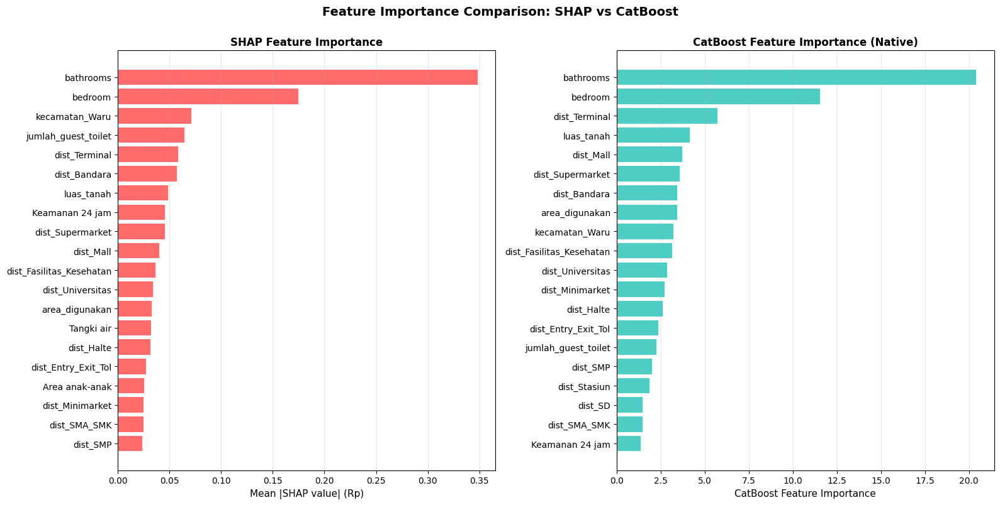

In [49]:
# SHAP Feature Importance Comparison dengan CatBoost Feature Importance
if shap_values_cb_original is not None:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # SHAP Importance
    shap_importance_cb = pd.DataFrame({
        'feature': feature_names_cb,
        'shap_importance': np.abs(shap_values_cb_original).mean(axis=0)
    }).sort_values('shap_importance', ascending=True).tail(20)

    axes[0].barh(range(len(shap_importance_cb)), shap_importance_cb['shap_importance'], color='#FF6B6B')
    axes[0].set_yticks(range(len(shap_importance_cb)))
    axes[0].set_yticklabels(shap_importance_cb['feature'])
    axes[0].set_xlabel('Mean |SHAP value| (Rp)', fontsize=11)
    axes[0].set_title('SHAP Feature Importance', fontsize=12, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

    # CatBoost Importance (Native)
    cb_importance = pd.DataFrame({
        'feature': X_train_CB.columns,
        'cb_importance': best_model.get_feature_importance()
    }).sort_values('cb_importance', ascending=True).tail(20)

    axes[1].barh(range(len(cb_importance)), cb_importance['cb_importance'], color='#4ECDC4')
    axes[1].set_yticks(range(len(cb_importance)))
    axes[1].set_yticklabels(cb_importance['feature'])
    axes[1].set_xlabel('CatBoost Feature Importance', fontsize=11)
    axes[1].set_title('CatBoost Feature Importance (Native)', fontsize=12, fontweight='bold')
    axes[1].grid(axis='x', alpha=0.3)

    plt.suptitle('Feature Importance Comparison: SHAP vs CatBoost', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping comparison plot.")


In [69]:
shap_value = pd.DataFrame({
        'feature': feature_names_cb,
        'shap_importance': np.abs(shap_values_cb_original).mean(axis=0)
    }).sort_values('shap_importance', ascending=True)

In [68]:
shap_value.to_csv('/kaggle/working/5_feature_importance_SHAP_Catboost_final.csv', index=False)


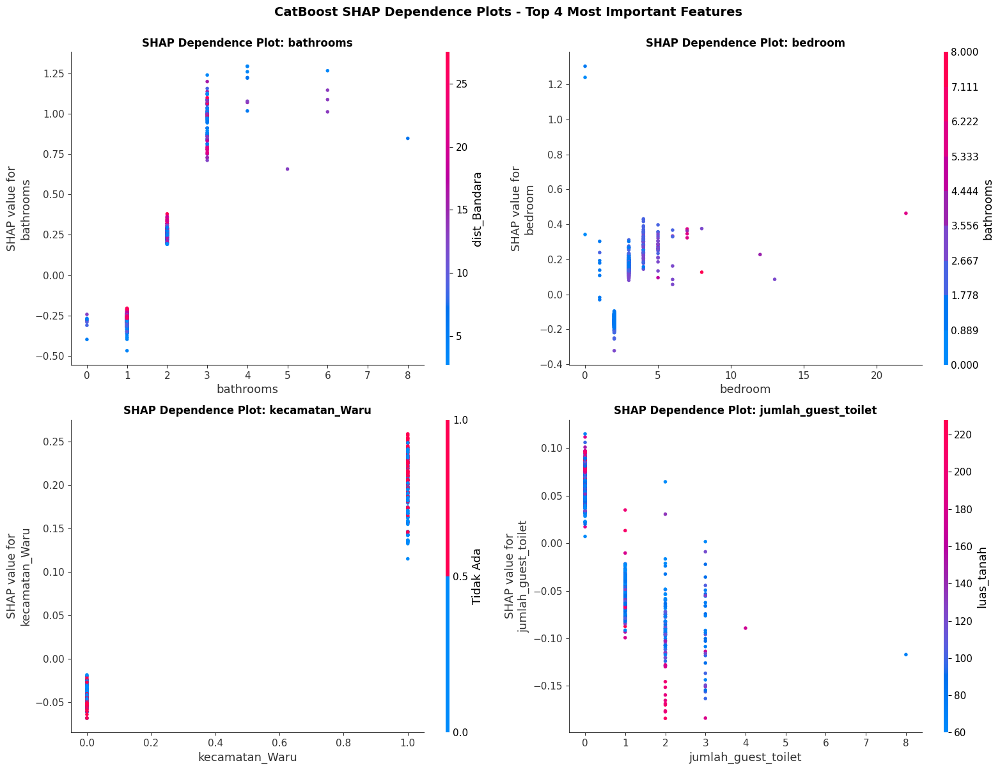

In [51]:
# SHAP Dependence Plot - Top 4 features - CatBoost
if shap_values_cb_original is not None:
    # Get top 4 features by mean absolute SHAP
    shap_importance_cb = pd.DataFrame({
        'feature': feature_names_cb,
        'importance': np.abs(shap_values_cb_original).mean(axis=0)
    }).sort_values('importance', ascending=False)

    top_4_features_cb = shap_importance_cb.head(4)['feature'].tolist()
    top_4_indices_cb = [feature_names_cb.index(f) for f in top_4_features_cb]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for i, (feature, feat_idx) in enumerate(zip(top_4_features_cb, top_4_indices_cb)):
        plt.sca(axes[i])
        shap.dependence_plot(
            feat_idx,
            shap_values_cb_original,
            X_shap_sample,
            feature_names=feature_names_cb,
            interaction_index="auto",
            show=False,
            ax=axes[i]
        )
        axes[i].set_title(f'SHAP Dependence Plot: {feature}', fontsize=12, fontweight='bold')

    plt.suptitle('CatBoost SHAP Dependence Plots - Top 4 Most Important Features', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping dependence plots.")


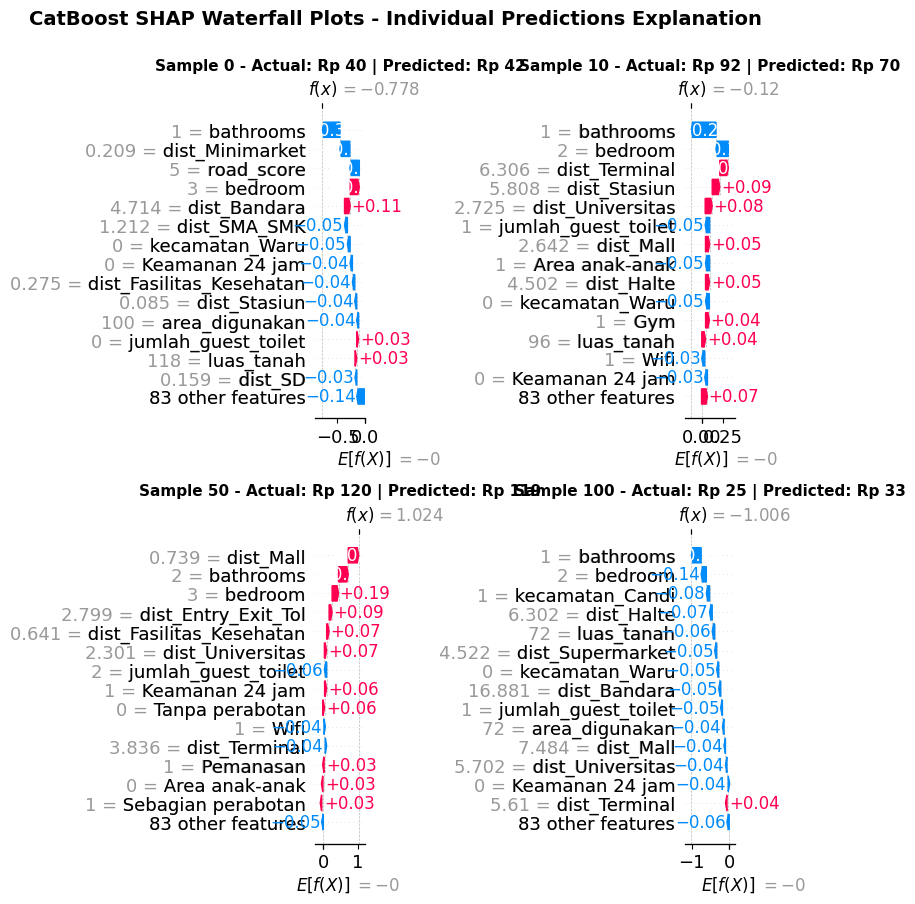

In [52]:
# SHAP Waterfall Plot - Contoh prediksi individual - CatBoost
if shap_values_cb_original is not None and expected_value_cb_original is not None:
    sample_idx = [0, 10, 50, 100]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for i, idx in enumerate(sample_idx):
        if idx < len(X_shap_sample):
            plt.sca(axes[i])
            shap.waterfall_plot(
                shap.Explanation(
                    values=shap_values_cb_original[idx],
                    base_values=float(expected_value_cb_original),
                    data=X_shap_sample.iloc[idx].values,
                    feature_names=feature_names_cb
                ),
                max_display=15,
                show=False
            )
            
            actual_price = y_shap_sample_original[idx]
            predicted_price = train_pred_cb_original[idx]
            axes[i].set_title(f'Sample {idx} - Actual: Rp {actual_price:,.0f} | Predicted: Rp {predicted_price:,.0f}', 
                             fontsize=11, fontweight='bold')

    plt.suptitle('CatBoost SHAP Waterfall Plots - Individual Predictions Explanation', 
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping waterfall plots.")


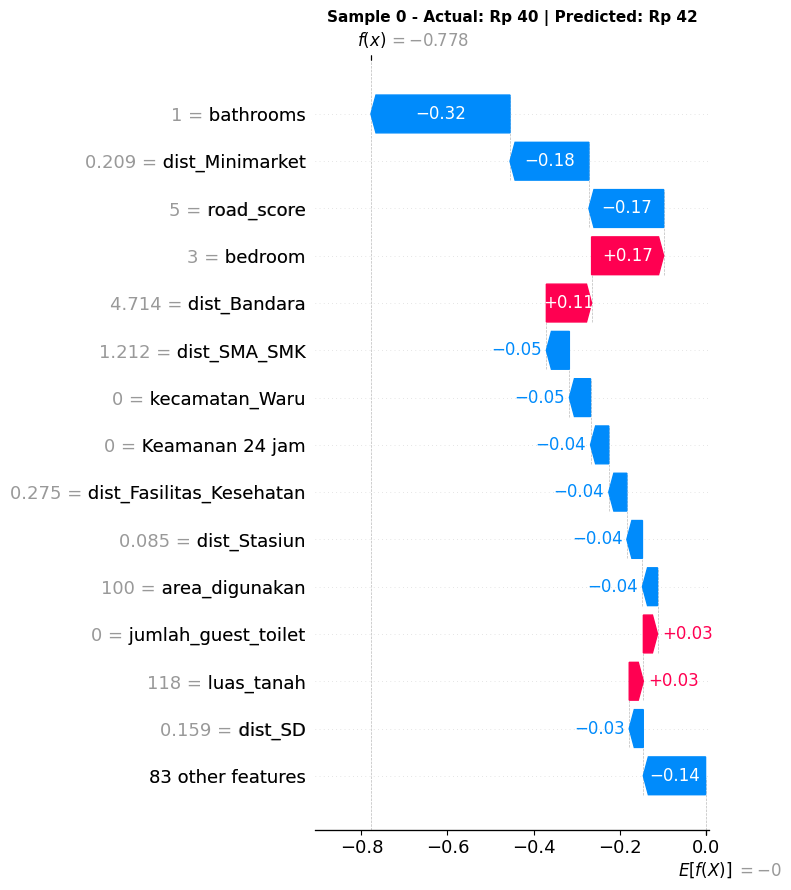

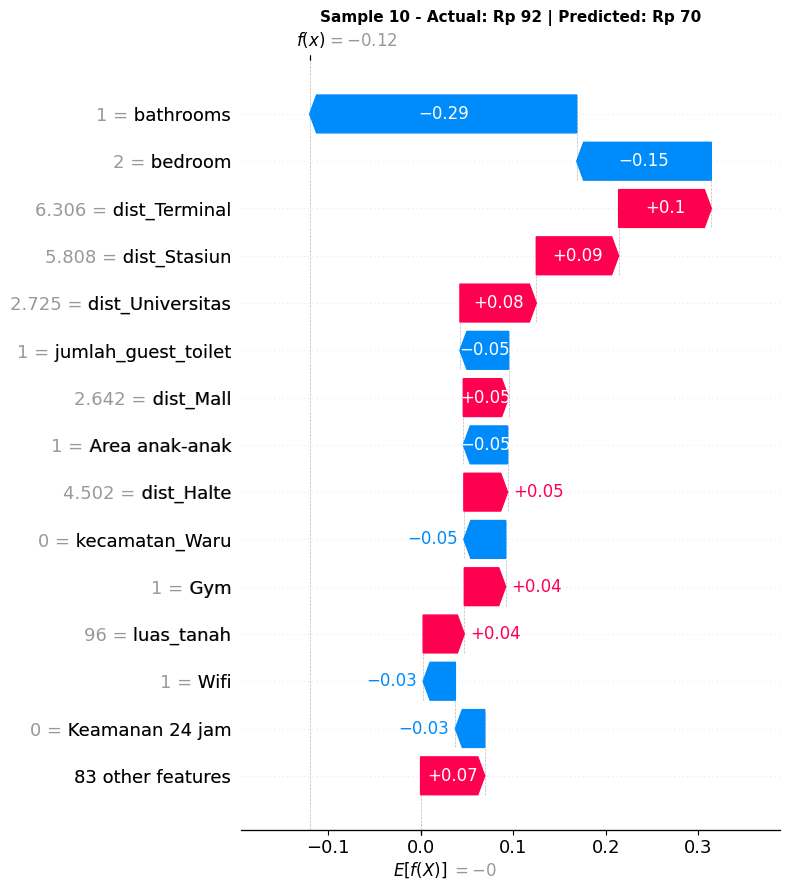

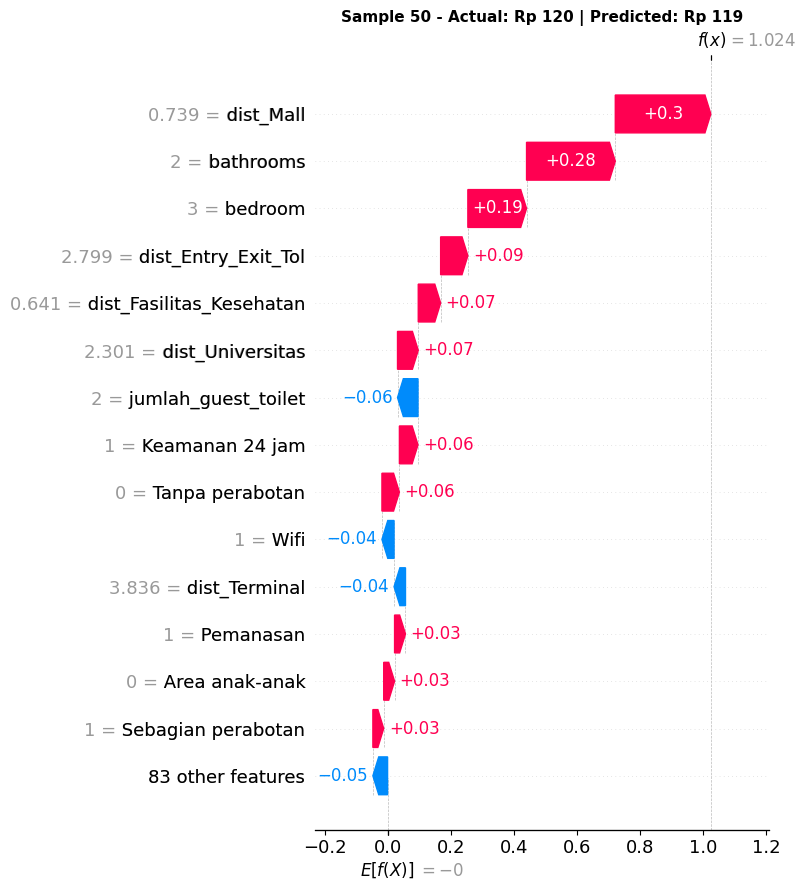

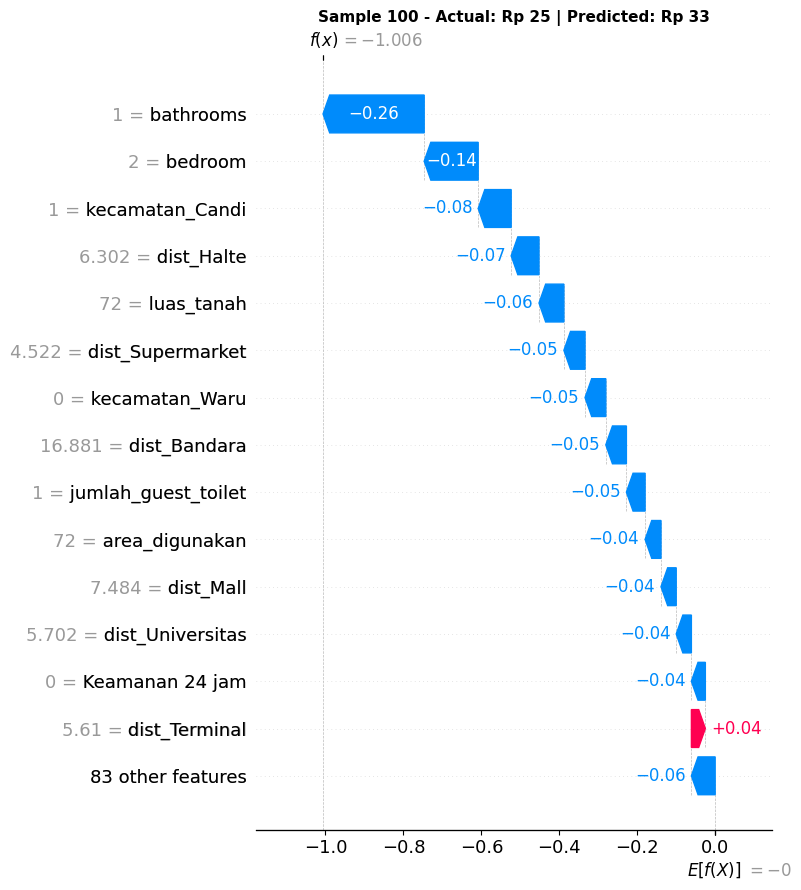

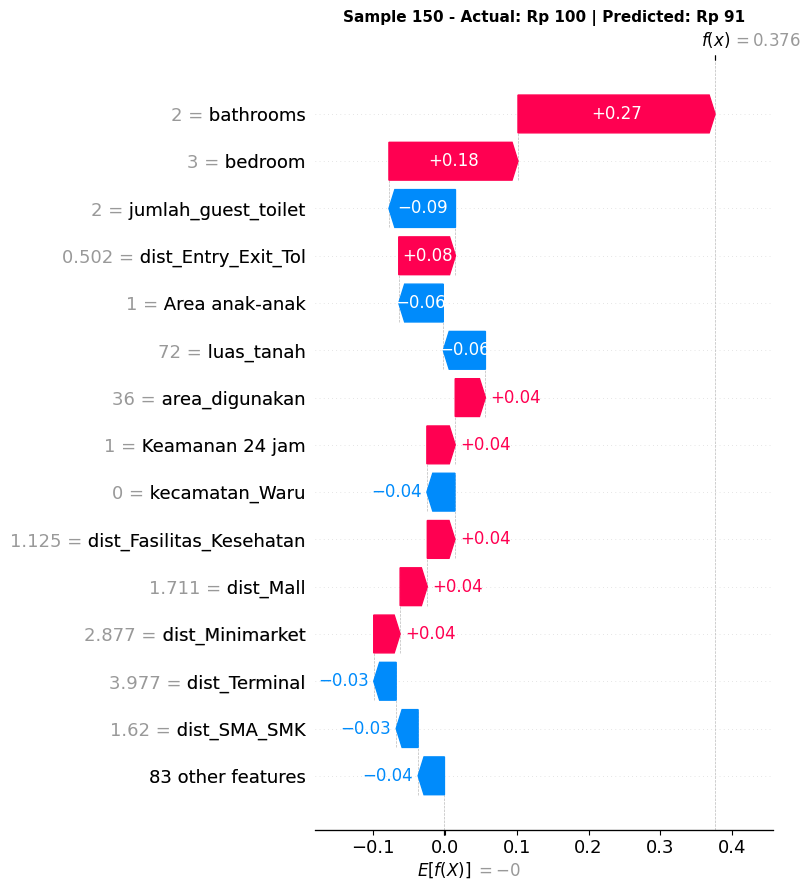

In [53]:
# SHAP Waterfall Plot - Output satu per satu (5 sampel) - CatBoost
if shap_values_cb_original is not None and expected_value_cb_original is not None:
    
    sample_idx = [0, 10, 50, 100, 150]  # 5 contoh
    
    for idx in sample_idx:
        if idx < len(X_shap_sample):
            
            plt.figure(figsize=(10, 6))  # Buat figure baru tiap loop
            
            shap.waterfall_plot(
                shap.Explanation(
                    values=shap_values_cb_original[idx],
                    base_values=float(expected_value_cb_original),
                    data=X_shap_sample.iloc[idx].values,
                    feature_names=feature_names_cb
                ),
                max_display=15,
                show=False
            )
            
            actual_price = y_shap_sample_original[idx]
            predicted_price = train_pred_cb_original[idx]
            
            plt.title(
                f"Sample {idx} - Actual: Rp {actual_price:,.0f} | Predicted: Rp {predicted_price:,.0f}",
                fontsize=11,
                fontweight="bold"
            )
            
            plt.tight_layout()
            plt.show()  # tampilkan satu-satu

else:
    print("⚠ SHAP values not available. Skipping waterfall plots.")

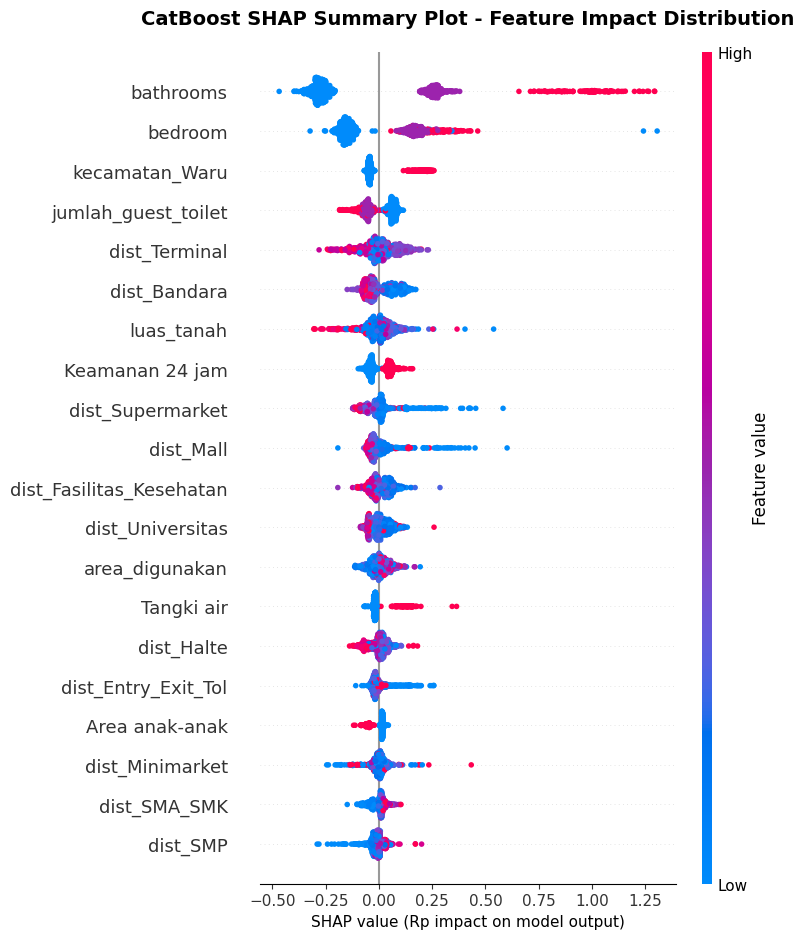

In [54]:
# SHAP Summary Plot - Beeswarm (Feature Impact Distribution) - CatBoost
if shap_values_cb_original is not None:
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values_cb_original, X_shap_sample, feature_names=feature_names_cb, max_display=20, show=False)
    plt.title('CatBoost SHAP Summary Plot - Feature Impact Distribution', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('SHAP value (Rp impact on model output)', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping beeswarm plot.")


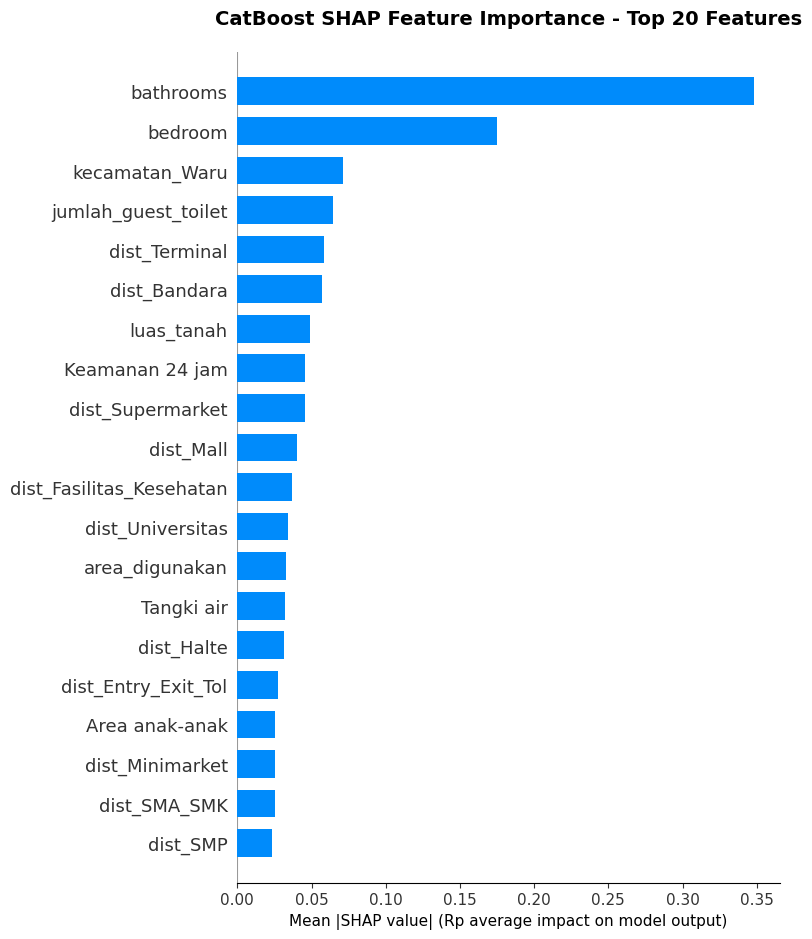

In [55]:
# SHAP Summary Plot - Bar (Feature Importance) - CatBoost
if shap_values_cb_original is not None:
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values_cb_original, X_shap_sample, feature_names=feature_names_cb, plot_type="bar", max_display=20, show=False)
    plt.title('CatBoost SHAP Feature Importance - Top 20 Features', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Mean |SHAP value| (Rp average impact on model output)', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("⚠ SHAP values not available. Skipping bar plot.")


# Plot visual

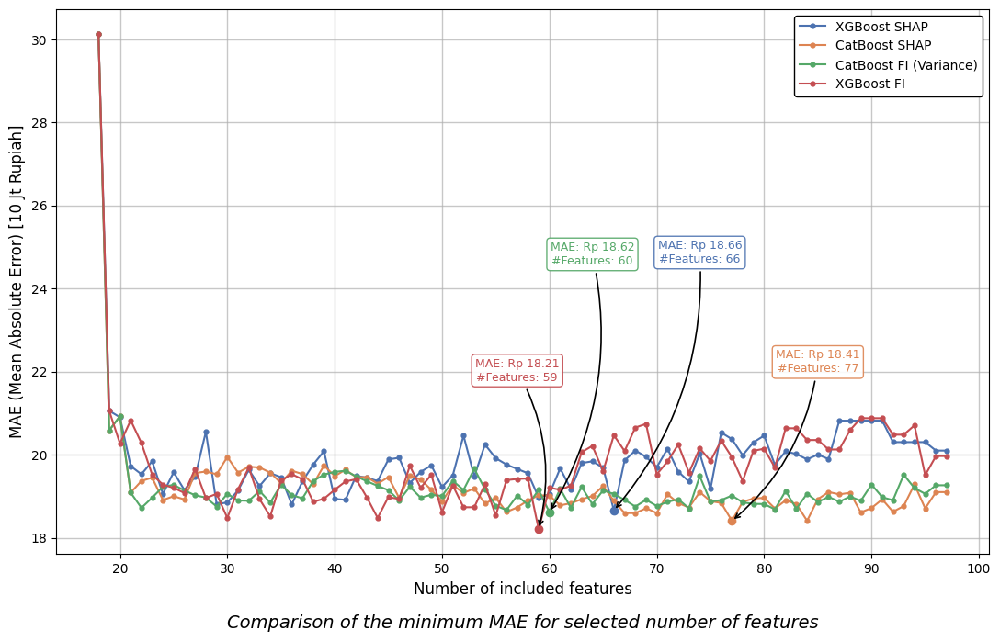

In [56]:
import matplotlib.pyplot as plt
import numpy as np

# Fungsi bantu untuk mencari nilai optimal dan indeksnya
def get_best(x_list, y_list):
    min_y = min(y_list)
    best_x = x_list[y_list.index(min_y)]
    return best_x, min_y

required_vars = [
    'x_xgb_shap', 'y_xgb_shap',
    'x_cb_shap', 'y_cb_shap',
    'x_cb_fi', 'y_cb_fi',
    'x_xgb_fi', 'y_xgb_fi'
]

if all(var in globals() for var in required_vars):
    # Tarik nilai terendah dari masing-masing model yang sudah kamu simpan
    best_x_xgb_shap, min_y_xgb_shap = get_best(x_xgb_shap, y_xgb_shap)
    best_x_cb_shap, min_y_cb_shap   = get_best(x_cb_shap, y_cb_shap)
    best_x_cb_fi, min_y_cb_fi       = get_best(x_cb_fi, y_cb_fi)
    best_x_xgb_fi, min_y_xgb_fi     = get_best(x_xgb_fi, y_xgb_fi)

    # =====================================================================
    # MENGGAMBAR GRAFIK GABUNGAN
    # =====================================================================
    plt.figure(figsize=(11, 7))

    # Plot Garis (Warna disesuaikan dengan gambar referensi jurnalmu)
    plt.plot(x_xgb_shap, y_xgb_shap, marker='.', linestyle='-', color='#4c72b0', markersize=7, label='XGBoost SHAP')      # Biru
    plt.plot(x_cb_shap, y_cb_shap, marker='.', linestyle='-', color='#dd8452', markersize=7, label='CatBoost SHAP')       # Oranye
    plt.plot(x_cb_fi, y_cb_fi, marker='.', linestyle='-', color='#55a868', markersize=7, label='CatBoost FI (Variance)')  # Hijau
    plt.plot(x_xgb_fi, y_xgb_fi, marker='.', linestyle='-', color='#c44e52', markersize=7, label='XGBoost FI')            # Merah

    # Plot Titik Merah/Optimal
    plt.plot(best_x_xgb_shap, min_y_xgb_shap, 'o', color='#4c72b0', markersize=6)
    plt.plot(best_x_cb_shap, min_y_cb_shap, 'o', color='#dd8452', markersize=6)
    plt.plot(best_x_cb_fi, min_y_cb_fi, 'o', color='#55a868', markersize=6)
    plt.plot(best_x_xgb_fi, min_y_xgb_fi, 'o', color='#c44e52', markersize=6)

    # Fungsi bantu untuk Anotasi Kotak (Callout)
    def draw_callout(teks, x_pos, y_pos, warna, offset_x, offset_y):
        plt.annotate(
            teks, xy=(x_pos, y_pos), xytext=(x_pos + offset_x, y_pos + offset_y),
            bbox=dict(boxstyle="round,pad=0.3", edgecolor=warna, facecolor='white', alpha=0.9),
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=-0.2", color='black', lw=1.2),
            fontsize=9, color=warna, ha='center'
        )

    # Hitung perkiraan rentang Y agar jarak kotak anotasi proporsional
    y_range = max(max(y_xgb_shap), max(y_xgb_fi), max(y_cb_shap), max(y_cb_fi)) - min(min(y_xgb_shap), min(y_xgb_fi), min(y_cb_shap), min(y_cb_fi))

    # Gambar Anotasi (Jika panahnya tumpang tindih, kamu bisa ubah nilai offset_x dan offset_y ini)
    draw_callout(f"MAE: Rp {min_y_xgb_shap:,.2f}\n#Features: {best_x_xgb_shap}", best_x_xgb_shap, min_y_xgb_shap, '#4c72b0', offset_x=8, offset_y=y_range*0.50)
    draw_callout(f"MAE: Rp {min_y_cb_shap:,.2f}\n#Features: {best_x_cb_shap}", best_x_cb_shap, min_y_cb_shap, '#dd8452', offset_x=8, offset_y=y_range*0.30)
    draw_callout(f"MAE: Rp {min_y_cb_fi:,.2f}\n#Features: {best_x_cb_fi}", best_x_cb_fi, min_y_cb_fi, '#55a868', offset_x=4, offset_y=y_range*0.50)
    draw_callout(f"MAE: Rp {min_y_xgb_fi:,.2f}\n#Features: {best_x_xgb_fi}", best_x_xgb_fi, min_y_xgb_fi, '#c44e52', offset_x=-2, offset_y=y_range*0.30)

    # Mempercantik Tampilan
    plt.title('Comparison of the minimum MAE for selected number of features', fontsize=14, fontstyle='italic', y=-0.15)
    plt.xlabel('Number of included features', fontsize=12)
    plt.ylabel('MAE (Mean Absolute Error) [10 Jt Rupiah]', fontsize=12)
    plt.legend(loc='upper right', framealpha=1, edgecolor='black')
    plt.grid(True, linestyle='-', linewidth=1, alpha=0.7)

    # Simpan dan Tampilkan
    plt.tight_layout()
    plt.savefig('gabungan_ifs_skripsi.png', dpi=300, bbox_inches='tight')
    plt.show()
else:
    missing = [v for v in required_vars if v not in globals()]
    print(f"Variabel belum tersedia untuk plotting gabungan: {missing}")

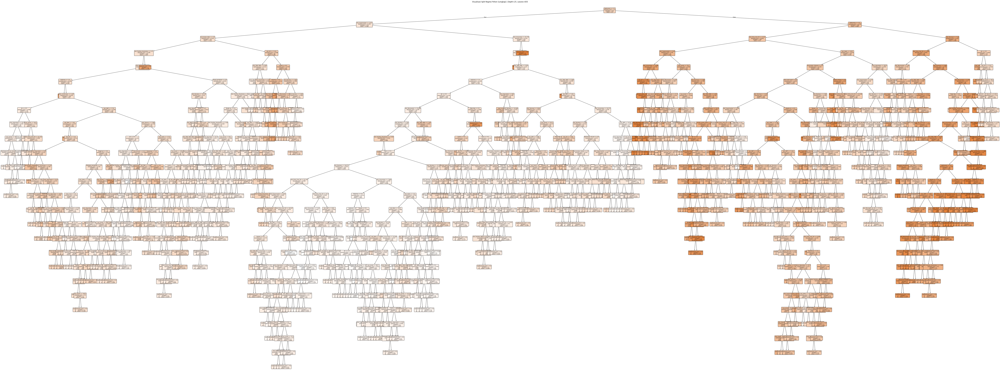

In [ ]:
# 2) Visualisasi split regresi pohon: lengkap dan maksimal depth 3 + simpan file resolusi tinggi
from pathlib import Path
from sklearn.tree import DecisionTreeRegressor, plot_tree

# Gunakan fitur optimal hasil seleksi IFS FI/SHAP XGBoost
if 'X_train_optimal' in globals() and hasattr(X_train_optimal, 'columns'):
    X_tree = X_train_optimal
elif 'best_features_final_xgb_fi' in globals():
    X_tree = X_train_XB[best_features_final_xgb_fi]
elif 'best_features_final_xgb_shap' in globals():
    X_tree = X_train_XB[best_features_final_xgb_shap]
elif 'best_features_final_xb' in globals():
    X_tree = X_train_XB[best_features_final_xb]
else:
    X_tree = X_train_XB

# Target untuk visualisasi pohon dalam skala asli (bukan hasil transformasi)
if 'inverse_transform_target' in globals():
    y_tree = inverse_transform_target(y_train_XB)
elif 'price_transformer' in globals():
    y_tree = price_transformer.inverse_transform(np.asarray(y_train_XB).reshape(-1, 1)).flatten()
else:
    y_tree = np.asarray(y_train_XB).flatten()

# Folder output penyimpanan visualisasi
output_dir = Path('output_data/tree_xgb_ifs_fi')
output_dir.mkdir(parents=True, exist_ok=True)

# Model pohon regresi untuk interpretasi split
# max_depth=None -> pohon lengkap
tree_full = DecisionTreeRegressor(random_state=42)
tree_full.fit(X_tree, y_tree)

# Ukuran figure adaptif agar full-depth lebih terbaca
full_depth = tree_full.get_depth()
full_leaves = tree_full.get_n_leaves()
fig_w_full = min(max(36, full_depth * 4), 180)
fig_h_full = min(max(16, full_leaves * 0.045), 80)

fig_full = plt.figure(figsize=(fig_w_full, fig_h_full))
plot_tree(
    tree_full,
    feature_names=X_tree.columns,
    filled=True,
    rounded=True,
    fontsize=8,
    impurity=True,
    precision=3
)
plt.title(f'Visualisasi Split Regresi Pohon (Lengkap, Skala Asli) | Depth={full_depth}, Leaves={full_leaves}')
plt.tight_layout()

# Simpan full-depth dalam format raster + vector
full_png = output_dir / 'tree_regression_full_depth_xgb_ifs_fi.png'
full_pdf = output_dir / 'tree_regression_full_depth_xgb_ifs_fi.pdf'
full_svg = output_dir / 'tree_regression_full_depth_xgb_ifs_fi.svg'

fig_full.savefig(full_png, dpi=450, bbox_inches='tight', pad_inches=0.2)
fig_full.savefig(full_pdf, bbox_inches='tight', pad_inches=0.2)
fig_full.savefig(full_svg, bbox_inches='tight', pad_inches=0.2)

plt.show()

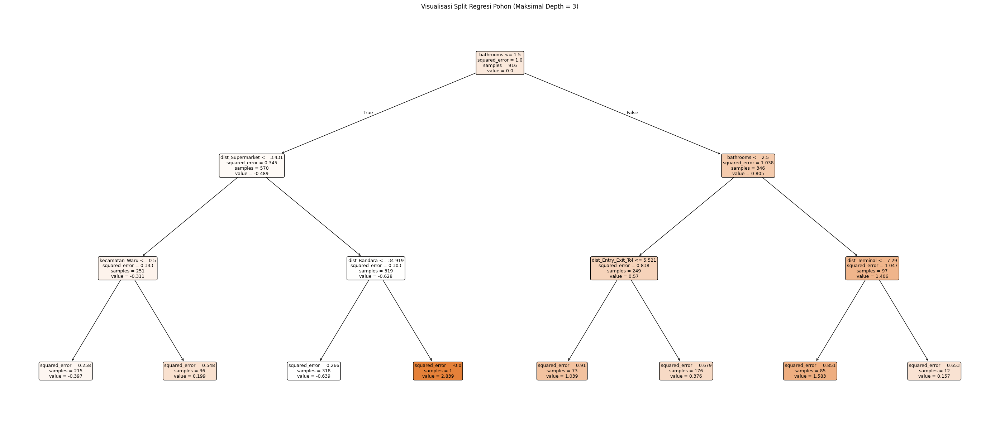

File visualisasi tersimpan di: /kaggle/working/output_data/tree_xgb_ifs_fi


In [ ]:
# max_depth=3 -> pohon dibatasi hingga depth 3
tree_depth3 = DecisionTreeRegressor(max_depth=3, random_state=42)

# Jika sel sebelumnya belum dijalankan, siapkan ulang target skala asli
if 'y_tree' not in globals():
    if 'inverse_transform_target' in globals():
        y_tree = inverse_transform_target(y_train_XB)
    elif 'price_transformer' in globals():
        y_tree = price_transformer.inverse_transform(np.asarray(y_train_XB).reshape(-1, 1)).flatten()
    else:
        y_tree = np.asarray(y_train_XB).flatten()

tree_depth3.fit(X_tree, y_tree)

# Perbesar kanvas agar kotak node lebih lega dan teks lebih terbaca
fig_depth3 = plt.figure(figsize=(40, 18))
plot_tree(
    tree_depth3,
    feature_names=X_tree.columns,
    filled=True,
    rounded=True,
    fontsize=14
)
plt.title('Visualisasi Split Regresi Pohon (Maksimal Depth = 3, Skala Asli)', fontsize=18, fontweight='bold', pad=16)
plt.tight_layout()

# Simpan depth-3
small_png = output_dir / 'tree_regression_depth3_xgb_ifs_fi.png'
small_pdf = output_dir / 'tree_regression_depth3_xgb_ifs_fi.pdf'
small_svg = output_dir / 'tree_regression_depth3_xgb_ifs_fi.svg'

fig_depth3.savefig(small_png, dpi=450, bbox_inches='tight', pad_inches=0.2)
fig_depth3.savefig(small_pdf, bbox_inches='tight', pad_inches=0.2)
fig_depth3.savefig(small_svg, bbox_inches='tight', pad_inches=0.2)

plt.show()

print('File visualisasi tersimpan di:', output_dir.resolve())

In [59]:
!zip -r hasil_output.zip /kaggle/working/output_data/tree_xgb_ifs_fi

  adding: kaggle/working/output_data/tree_xgb_ifs_fi/ (stored 0%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_full_depth_xgb_ifs_fi.svg (deflated 94%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_depth3_xgb_ifs_fi.pdf (deflated 28%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_full_depth_xgb_ifs_fi.png (deflated 13%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_full_depth_xgb_ifs_fi.pdf (deflated 4%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_depth3_xgb_ifs_fi.svg (deflated 88%)
  adding: kaggle/working/output_data/tree_xgb_ifs_fi/tree_regression_depth3_xgb_ifs_fi.png (deflated 30%)


['kecamatan_Balongbendo',
 'kecamatan_Buduran',
 'kecamatan_Candi',
 'kecamatan_Gedangan',
 'kecamatan_Jabon',
 'kecamatan_Krembung',
 'kecamatan_Krian',
 'kecamatan_Porong',
 'kecamatan_Prambon',
 'kecamatan_Sedati',
 'kecamatan_Sidoarjo',
 'kecamatan_Sukodono',
 'kecamatan_Taman',
 'kecamatan_Tanggulangin',
 'kecamatan_Tarik',
 'kecamatan_Tulangan',
 'kecamatan_Waru',
 'kecamatan_Wonoayu',
 'bathrooms',
 'bedroom',
 'dist_Terminal',
 'dist_Bandara',
 'dist_Universitas',
 'dist_Mall',
 'area_digunakan',
 'dist_Fasilitas_Kesehatan',
 'dist_SMA_SMK',
 'dist_SD',
 'luas_tanah',
 'dist_Minimarket',
 'dist_Supermarket',
 'jumlah_guest_toilet',
 'dist_Stasiun',
 'Tangki air',
 'dist_SMP',
 'Keamanan 24 jam',
 'dist_Halte',
 'AC',
 'road_score',
 'dist_Entry_Exit_Tol',
 'Garasi',
 'Tanpa perabotan',
 'Lapangan tenis',
 'Rumah jaga',
 'Akses bagi penyandang disabilitas',
 'Sebagian perabotan',
 'Fully fenced',
 'Internet',
 'Wifi',
 'Taman',
 'Keamanan',
 'Teras',
 'lantai',
 'Listrik',
 'Are